In [1]:
import dask.dataframe as dd
import pandas as pd
import folium
import datetime
import time
import numpy as np
import matplotlib
matplotlib.use('nbagg')
import matplotlib.pylab as plt
import seaborn as sns
from matplotlib import rcParams
import gpxpy.geo
from sklearn.cluster import MiniBatchKMeans, KMeans#Clustering
import math
import pickle
import os
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# Data Information

<p>
Ge the data from : http://www.nyc.gov/html/tlc/html/about/trip_record_data.shtml (2016 data)
The data used in the attached datasets were collected and provided to the NYC Taxi and Limousine Commission (TLC) 
</p>

## Information on taxis:

<h5> Yellow Taxi: Yellow Medallion Taxicabs</h5>
<p> These are the famous NYC yellow taxis that provide transportation exclusively through street-hails. The number of taxicabs is limited by a finite number of medallions issued by the TLC. You access this mode of transportation by standing in the street and hailing an available taxi with your hand. The pickups are not pre-arranged.</p>

<h5> For Hire Vehicles (FHVs) </h5>
<p> FHV transportation is accessed by a pre-arrangement with a dispatcher or limo company. These FHVs are not permitted to pick up passengers via street hails, as those rides are not considered pre-arranged. </p>

<h5> Green Taxi: Street Hail Livery (SHL) </h5>
<p>  The SHL program will allow livery vehicle owners to license and outfit their vehicles with green borough taxi branding, meters, credit card machines, and ultimately the right to accept street hails in addition to pre-arranged rides. </p>
<p> Credits: Quora</p>

<h5>Footnote:</h5>
In the given notebook we are considering only the yellow taxis for the time period between Jan - Mar 2015 & Jan - Mar 2016

# Data Collection
We Have collected all yellow taxi trips data from jan-2015 to dec-2016(Will be using only 2015 data)
<table>
<tr>
<th> file name </th>
<th> file name size</th>
<th> number of records </th>
<th> number of features </th>
</tr>
<tr>
<td> yellow_tripdata_2016-01 </td>
<td> 1. 59G </td>
<td> 10906858 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-02 </td>
<td> 1. 66G </td>
<td> 11382049 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-03 </td>
<td> 1. 78G </td>
<td> 12210952 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-04 </td>
<td> 1. 74G </td>
<td> 11934338 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-05 </td>
<td> 1. 73G </td>
<td> 11836853 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-06 </td>
<td> 1. 62G </td>
<td> 11135470 </td>
<td> 19 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-07 </td>
<td> 884Mb </td>
<td> 10294080 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-08 </td>
<td> 854Mb </td>
<td> 9942263 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-09 </td>
<td> 870Mb </td>
<td> 10116018 </td>
<td> 17 </td>
</tr>

<tr>
<td> yellow_tripdata_2016-10 </td>
<td> 933Mb </td>
<td> 10854626 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-11 </td>
<td> 868Mb </td>
<td> 10102128 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2016-12 </td>
<td> 897Mb </td>
<td> 10449408 </td>
<td> 17 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-01 </td>
<td> 1.84Gb </td>
<td> 12748986 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-02 </td>
<td> 1.81Gb </td>
<td> 12450521 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-03 </td>
<td> 1.94Gb </td>
<td> 13351609 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-04 </td>
<td> 1.90Gb </td>
<td> 13071789 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-05 </td>
<td> 1.91Gb </td>
<td> 13158262 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-06 </td>
<td> 1.79Gb </td>
<td> 12324935 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-07 </td>
<td> 1.68Gb </td>
<td> 11562783 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-08 </td>
<td> 1.62Gb </td>
<td> 11130304 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-09 </td>
<td> 1.63Gb </td>
<td> 11225063 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-10 </td>
<td> 1.79Gb </td>
<td> 12315488 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-11 </td>
<td> 1.65Gb </td>
<td> 11312676 </td>
<td> 19 </td>
</tr>
<tr>
<td> yellow_tripdata_2015-12 </td>
<td> 1.67Gb </td>
<td> 11460573 </td>
<td> 19 </td>
</tr>
</table>

In [2]:
# List of features at Jan 2015
month = dd.read_csv('yellow_tripdata_2015-01.csv')
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


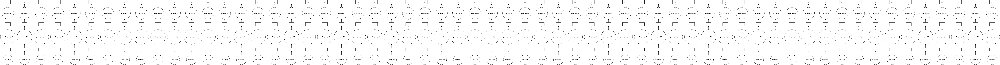

In [3]:
# How operation on Dask instead of Pandas
month.visualize()

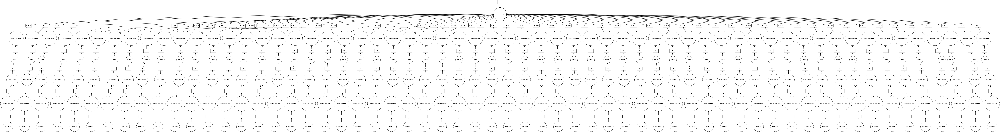

In [4]:
month.fare_amount.sum().visualize()

## Features in the dataset:
<table border="1">
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_longitude</td>
		<td>Longitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>Pickup_latitude</td>
		<td>Latitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
    <tr>
		<td>Store_and_fwd_flag</td>
		<td>This flag indicates whether the trip record was held in vehicle memory before sending to the vendor,<br\> aka “store and forward,” because the vehicle did not have a connection to the server.<br\>Y= store and forward trip<br\>N= not a store and forward trip
		</td>
	</tr>
    <tr>
		<td>Dropoff_longitude</td>
		<td>Longitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Dropoff_ latitude</td>
		<td>Latitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

# ML Problem Formulation
<p><b> Time-series forecasting and Regression</b></p>
<br>
-<i> To find number of pickups, given location cordinates(latitude and longitude) and time, in the query reigion and surrounding regions.</i>
<p> 
To solve the above we would be using data collected in Jan - Mar 2015 to predict the pickups in Jan - Mar 2016.
</p>

# Performance metrics
1. Mean Absolute percentage error.
2. Mean Squared error.

# Data Cleaning
* Univariant Analysis
* Remove Outliers

In [5]:
month.head(5)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


### 1. Pickup Latitude and Pickup Longitude
It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by the 
* location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) 

so hence __any cordinates not within these cordinates are not considered__ by us as we are only concerned with pickups which originate within New York.

In [6]:
# Region that are out of bound
outlier_locations = month[((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774)| \
                   (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]

In [9]:
# Map with given range
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# Taking 10k data as outlier to see the result in map to get better vizualization and understanding
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['pickup_latitude'],j['pickup_longitude']))).add_to(map_osm)
map_osm

<b>Observation:-</b> As you can see above that there are some points just outside the boundary but there are a few that are in either South america, Mexico or Canada

### 2. Dropoff Latitude & Dropoff Longitude

It is inferred from the source https://www.flickr.com/places/info/2459115 that New York is bounded by 
* the location cordinates(lat,long) - (40.5774, -74.15) & (40.9176,-73.7004) 

so hence __any cordinates not within these cordinates are not considered__ by us as we are only concerned with dropoffs which are within New York.

In [10]:
# Region that are out of bound
outlier_locations = month[((month.dropoff_longitude <= -74.15) | (month.dropoff_latitude <= 40.5774)| \
                   (month.dropoff_longitude >= -73.7004) | (month.dropoff_latitude >= 40.9176))]

In [11]:
# Map with given range
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')

# Taking 10k data as outlier to see the result in map to get better vizualization and understanding
sample_locations = outlier_locations.head(10000)
for i,j in sample_locations.iterrows():
    if int(j['pickup_latitude']) != 0:
        folium.Marker(list((j['dropoff_latitude'],j['dropoff_longitude']))).add_to(map_osm)
map_osm

<b>Observation:-</b> The observations here are similar to those obtained while analysing pickup latitude and longitude

### 3. Trip Durations

According to NYC Taxi &amp; Limousine Commision Regulations __the maximum allowed trip duration in a 24 hour interval is 12 hours.__

In [12]:
month.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


In [13]:
# Convert Time into Unix Timestamp
def convert_time_to_unix(s):
    '''
    To convert time into unix timestamp
    '''
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())

In [17]:
def return_with_trip_times(month):
    '''
    Calculate Trip duration
    
    Return with features:
    Passanger counts, Trip distance, pickup long. and lat., dropoff long. and lat., Total amount, Trip time(duration),
    Pickup time, Speed
    '''
    print('Dask Compute')
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()
    
    # Pickups and Dropoffs datetime to unix timesta,p
    duration_pickup = [convert_time_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_time_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]
    
    # Calculate duration of trips = (Duration dropoff in seconds - Duration pickup in seconds)
    # Since it is in seconds, To convert into minutes = divide by 60
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    # Append durations of trips and speed in miles/hr to a new dataframe
    print('Appending Features')
    new_frame = month[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','total_amount']].compute()
    
    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    
    # Speed = Distance/Time
    # Since Time is in seconds, to convert into mins, replace Time with Time/60
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])
    
    return new_frame

In [18]:
frame_with_durations = return_with_trip_times(month)

Dask Compute


<IPython.core.display.Javascript object>


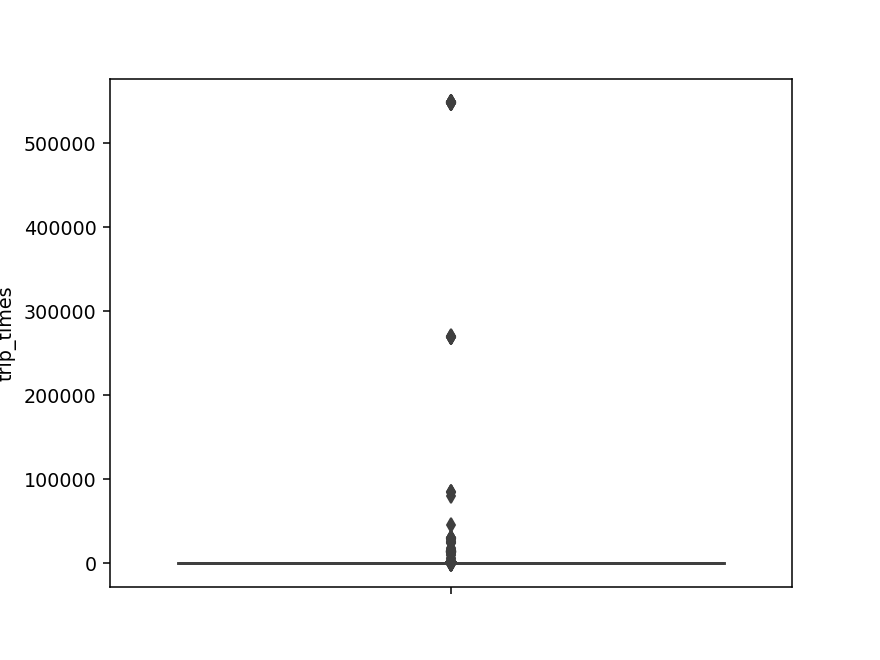

In [19]:
# Let see the boxplot of Trip duration
sns.boxplot(y="trip_times", data =frame_with_durations)
plt.show()

In [20]:
# Calculate percentile of trip duration to order to get inferential and perform removal outlier
for i in range(0,100,10):
    var = frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

0 percentile value is -1211.0166666666667
10 percentile value is 3.8333333333333335
20 percentile value is 5.383333333333334
30 percentile value is 6.816666666666666
40 percentile value is 8.3
50 percentile value is 9.95
60 percentile value is 11.866666666666667
70 percentile value is 14.283333333333333
80 percentile value is 17.633333333333333
90 percentile value is 23.45
100 percentile value is  548555.6333333333


In [21]:
#looking further from the 99th percecntile
for i in range(90,100):
    var = frame_with_durations["trip_times"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 23.45
91 percentile value is 24.35
92 percentile value is 25.383333333333333
93 percentile value is 26.55
94 percentile value is 27.933333333333334
95 percentile value is 29.583333333333332
96 percentile value is 31.683333333333334
97 percentile value is 34.46666666666667
98 percentile value is 38.71666666666667
99 percentile value is 46.75
100 percentile value is  548555.6333333333


In [22]:
#removing data based on our analysis and TLC regulations
# Trip duration -- greater than 1 minutes and less than 12hrs(720 minutes)
frame_with_durations_modified=frame_with_durations[(frame_with_durations.trip_times>1) & (frame_with_durations.trip_times<720)]

<IPython.core.display.Javascript object>


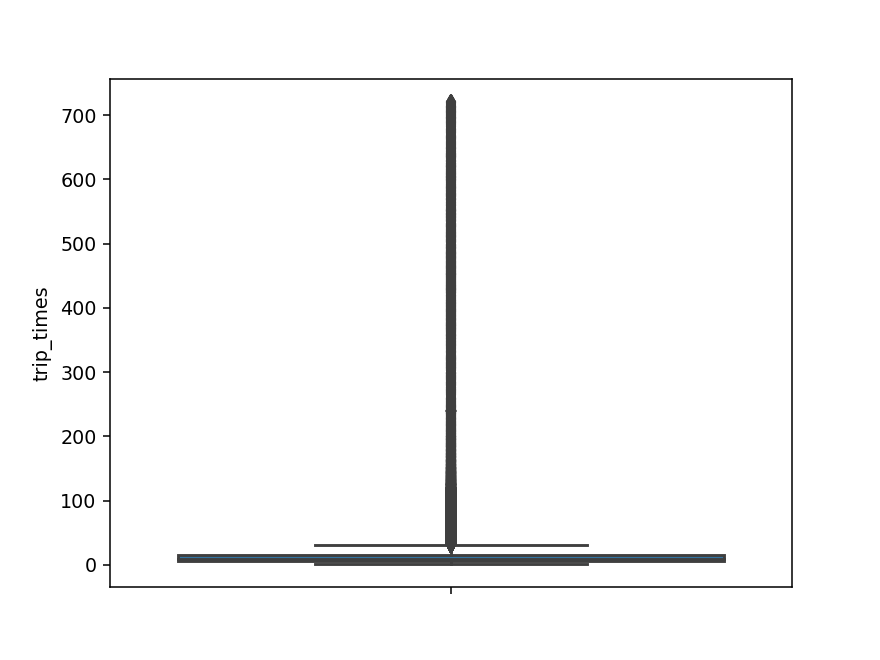

In [23]:
# Let see box-plot after removal of outliers
sns.boxplot(y="trip_times", data =frame_with_durations_modified)
plt.show()

<IPython.core.display.Javascript object>


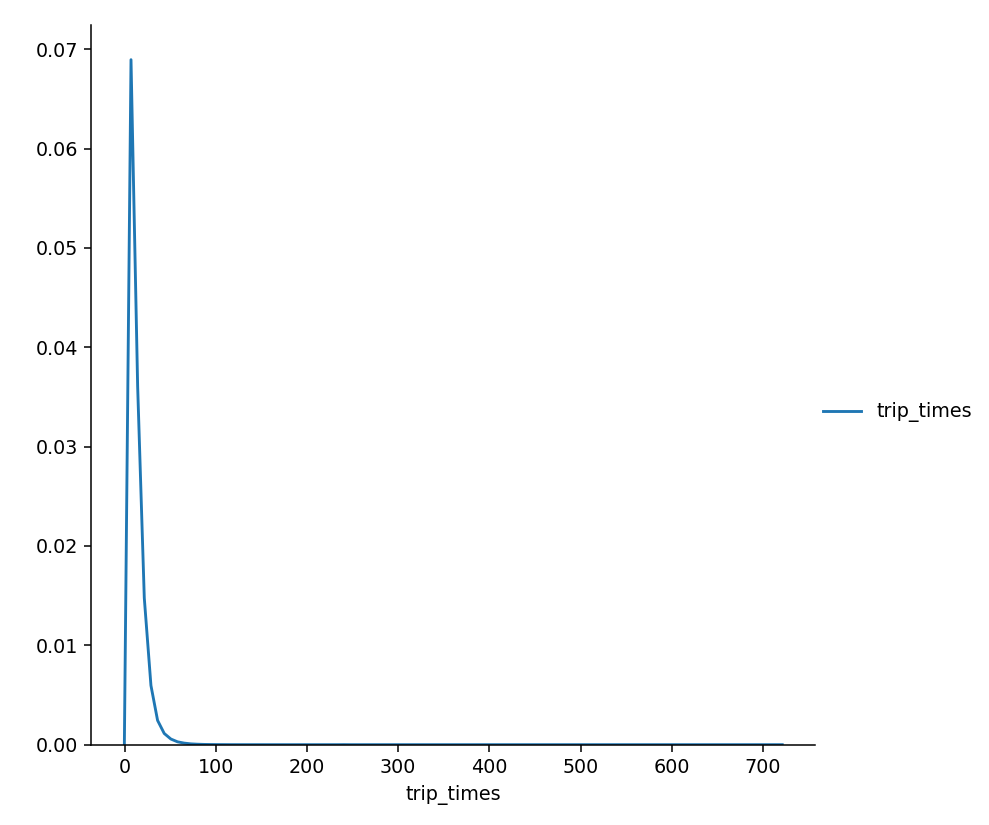

In [24]:
# Pdf of trip duration after removing the outliers
sns.FacetGrid(frame_with_durations_modified,size=6) \
      .map(sns.kdeplot,"trip_times") \
      .add_legend();
plt.show()

In [25]:
# Converting the values to log-values to check for log-normal
import math
frame_with_durations_modified['log_times']=[math.log(i) for i in frame_with_durations_modified['trip_times'].values]

<IPython.core.display.Javascript object>


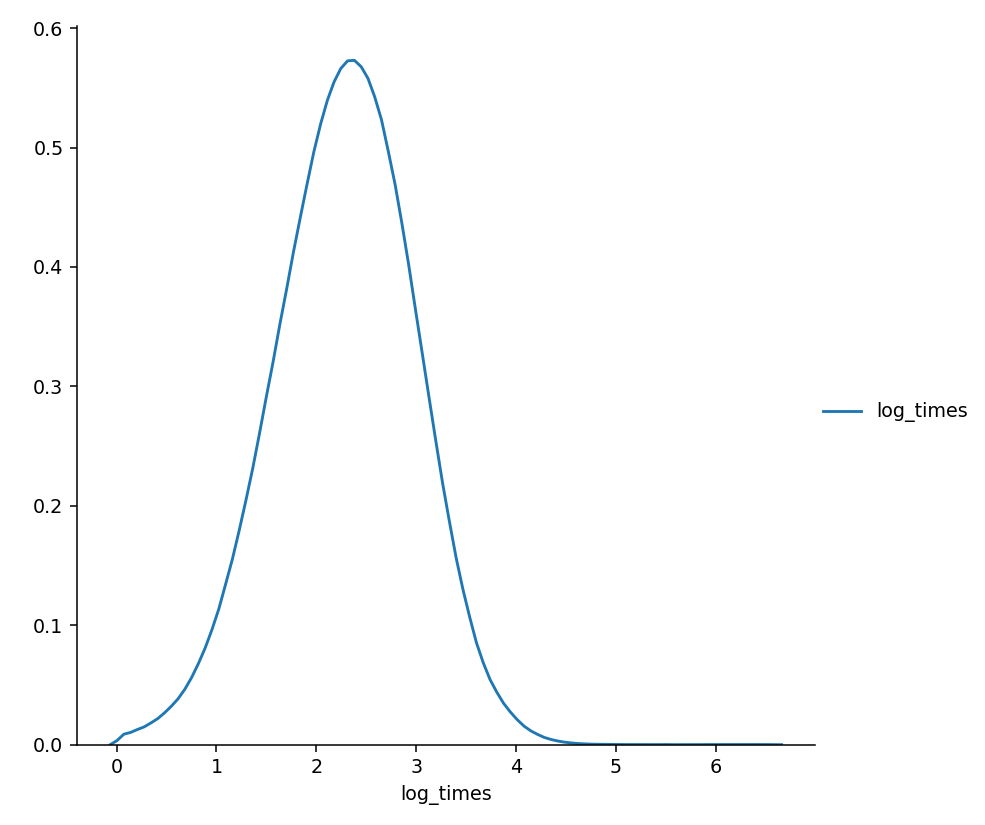

In [26]:
# Pdf of log-time
sns.FacetGrid(frame_with_durations_modified,size=6) \
      .map(sns.kdeplot,"log_times") \
      .add_legend();
plt.show()

<IPython.core.display.Javascript object>


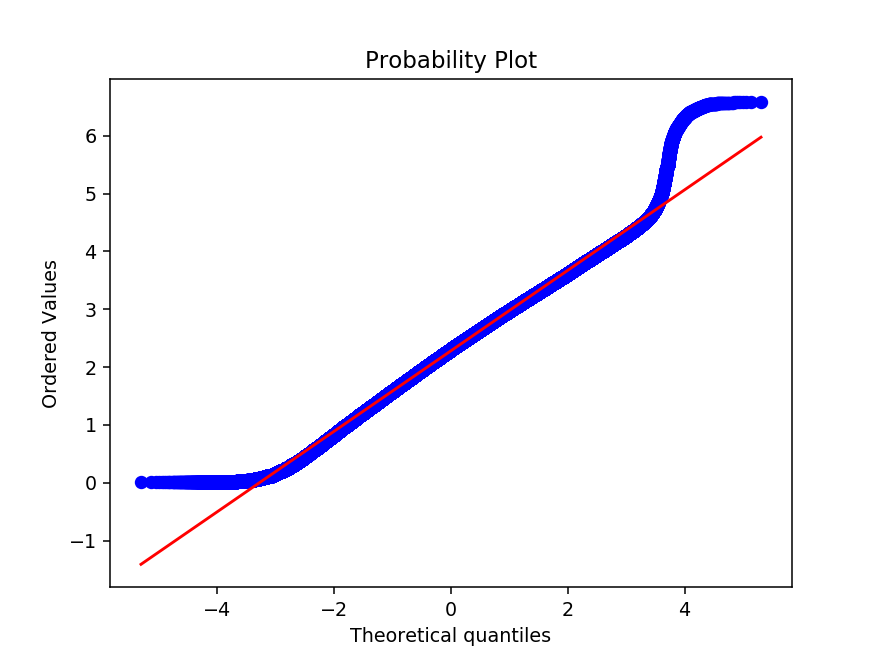

In [27]:
# Q-Q plot for checking if trip-times is log-normal
import scipy
scipy.stats.probplot(frame_with_durations_modified['log_times'].values, plot=plt)
plt.show()

### 4. Speed

<IPython.core.display.Javascript object>


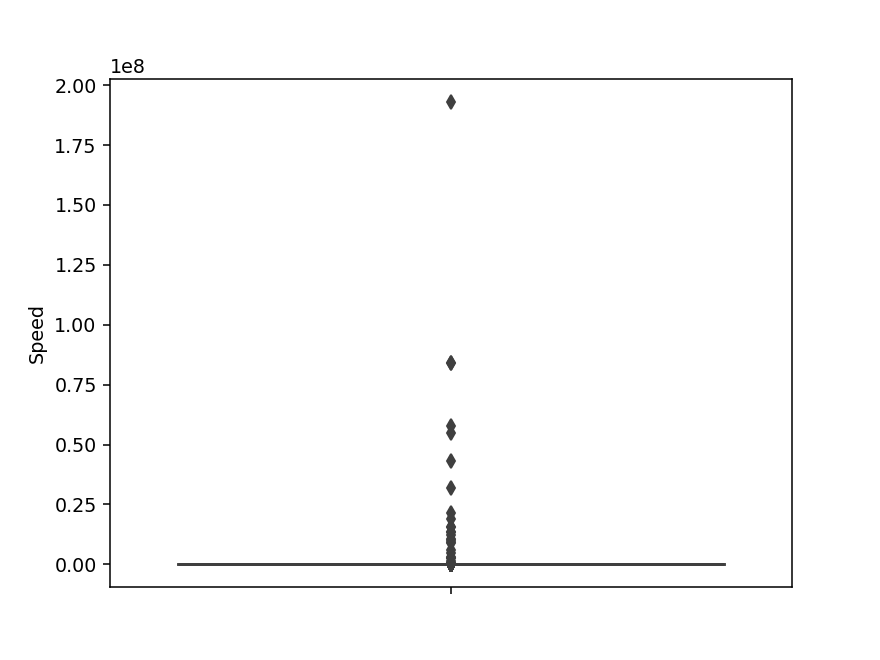

In [28]:
# Since we removed some of the trip duration time, so this will also affect on speed also
# So, we calculate speed = Distance/Time
# Replace Time with Time/60 (for hrs)
# Remember- Trip duration in previous ones was in minutes and if we divide by 60, then it will coonvert to hrs
# Let see the boxplot of this speed attribute
frame_with_durations_modified['Speed'] = 60*(frame_with_durations_modified['trip_distance']/frame_with_durations_modified['trip_times'])
sns.boxplot(y="Speed", data = frame_with_durations_modified)
plt.show()

In [29]:
# Calculate percentile of speed to order to get inferential and perform removal outlier
for i in range(0,100,10):
    var = frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 6.409495548961425
20 percentile value is 7.80952380952381
30 percentile value is 8.929133858267717
40 percentile value is 9.98019801980198
50 percentile value is 11.06865671641791
60 percentile value is 12.286689419795222
70 percentile value is 13.796407185628745
80 percentile value is 15.963224893917962
90 percentile value is 20.186915887850468
100 percentile value is  192857142.85714284


In [30]:
# Calculating speed values on 90th-100th percetile
for i in range(90,100):
    var = frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 20.186915887850468
91 percentile value is 20.91645569620253
92 percentile value is 21.752988047808763
93 percentile value is 22.721893491124263
94 percentile value is 23.844155844155843
95 percentile value is 25.182552504038775
96 percentile value is 26.80851063829787
97 percentile value is 28.84304932735426
98 percentile value is 31.591128254580514
99 percentile value is 35.7513566847558
100 percentile value is  192857142.85714284


In [31]:
#calculating speed values in 99.0 to 100.0 percentile with interval 0.1
for i in np.arange(0.0, 1.0, 0.1):
    var = frame_with_durations_modified["Speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 35.7513566847558
99.1 percentile value is 36.31084727468969
99.2 percentile value is 36.91470054446461
99.3 percentile value is 37.588235294117645
99.4 percentile value is 38.33035714285714
99.5 percentile value is 39.17580340264651
99.6 percentile value is 40.15384615384615
99.7 percentile value is 41.338301043219076
99.8 percentile value is 42.86631016042781
99.9 percentile value is 45.3107822410148
100 percentile value is  192857142.85714284


In [32]:
# Removing further outliers based on the 99.9th percentile value
# Speed -- greater than 0 and less than 45.31
frame_with_durations_modified=frame_with_durations[(frame_with_durations.Speed>0) & (frame_with_durations.Speed<45.31)]

In [33]:
# Avg.speed of cabs in New-York
sum(frame_with_durations_modified["Speed"]) / float(len(frame_with_durations_modified["Speed"]))

12.450173996027528

The __avg speed__ in Newyork speed is __12.45miles/hr__, so a cab driver can travel __2 miles per 10min on avg.__

### 5. Trip Distance

<IPython.core.display.Javascript object>


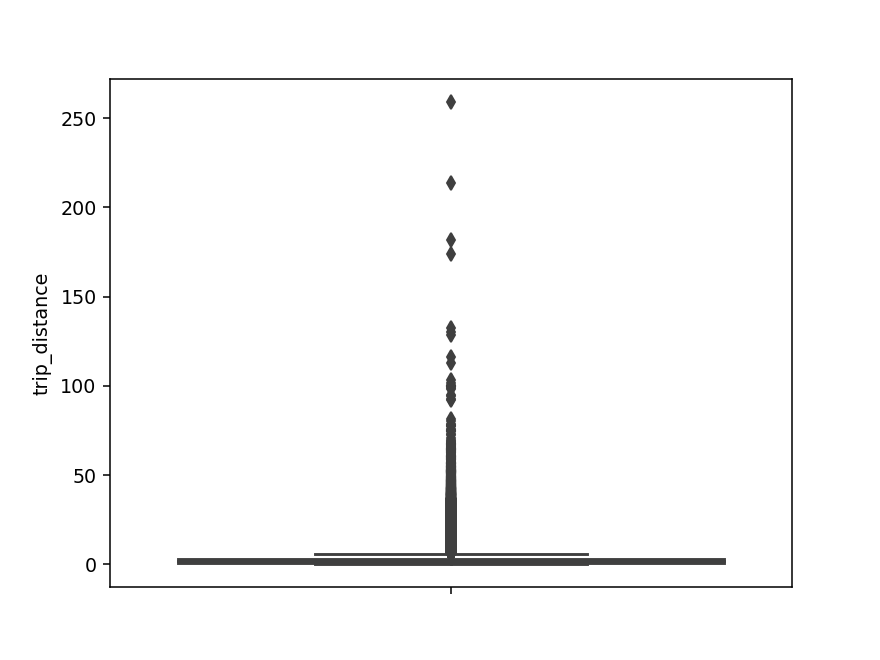

In [34]:
# Upto now we have removed the outliers based on trip durations and speeds
# lets try if there are any outliers in trip distances
# Let see the box-plot in trip-distance
sns.boxplot(y="trip_distance", data =frame_with_durations_modified)
plt.show()

In [35]:
# Calculating trip distance values on percentile with interval 10
for i in range(0,100,10):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.66
20 percentile value is 0.9
30 percentile value is 1.1
40 percentile value is 1.39
50 percentile value is 1.69
60 percentile value is 2.07
70 percentile value is 2.6
80 percentile value is 3.6
90 percentile value is 5.97
100 percentile value is  258.9


In [36]:
# Calculating trip distance values on percentile 90th-100th with interval 1
for i in range(90,100):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 5.97
91 percentile value is 6.45
92 percentile value is 7.07
93 percentile value is 7.85
94 percentile value is 8.72
95 percentile value is 9.6
96 percentile value is 10.6
97 percentile value is 12.1
98 percentile value is 16.03
99 percentile value is 18.17
100 percentile value is  258.9


In [37]:
# Calculating trip distance values on percentile 99 to 100 with interval 0.1
for i in np.arange(0.0, 1.0, 0.1):
    var =frame_with_durations_modified["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 18.17
99.1 percentile value is 18.37
99.2 percentile value is 18.6
99.3 percentile value is 18.83
99.4 percentile value is 19.13
99.5 percentile value is 19.5
99.6 percentile value is 19.96
99.7 percentile value is 20.5
99.8 percentile value is 21.22
99.9 percentile value is 22.57
100 percentile value is  258.9


In [38]:
# Removing further outliers based on the 99.9th percentile value
# Trip distance -- greater than 0 and less than 23
frame_with_durations_modified = frame_with_durations[(frame_with_durations.trip_distance>0) & (frame_with_durations.trip_distance<23)]

<IPython.core.display.Javascript object>


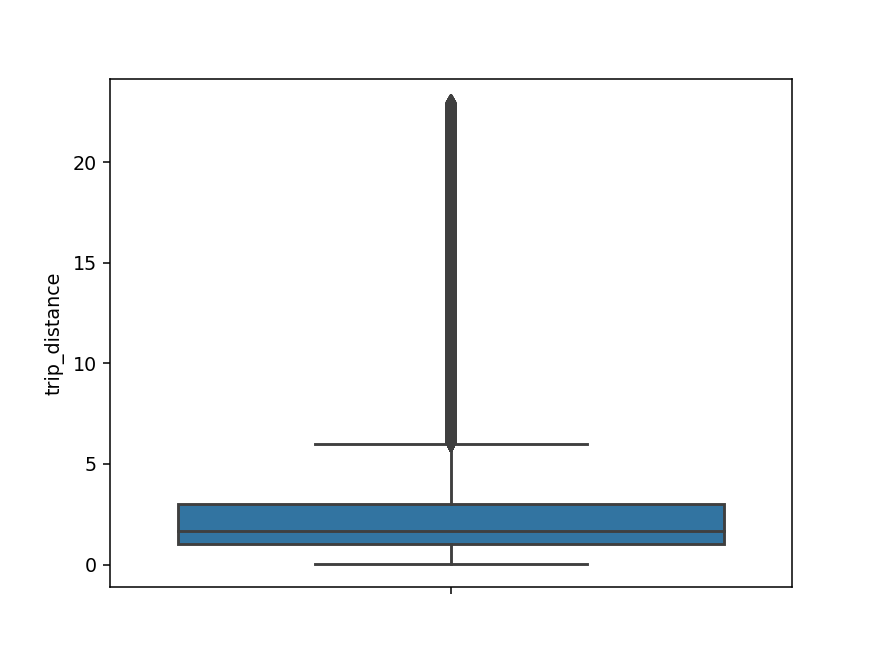

In [39]:
# Let see the box-plot after removal of outliers
sns.boxplot(y="trip_distance", data = frame_with_durations_modified)
plt.show()

### 6. Total Fare

<IPython.core.display.Javascript object>


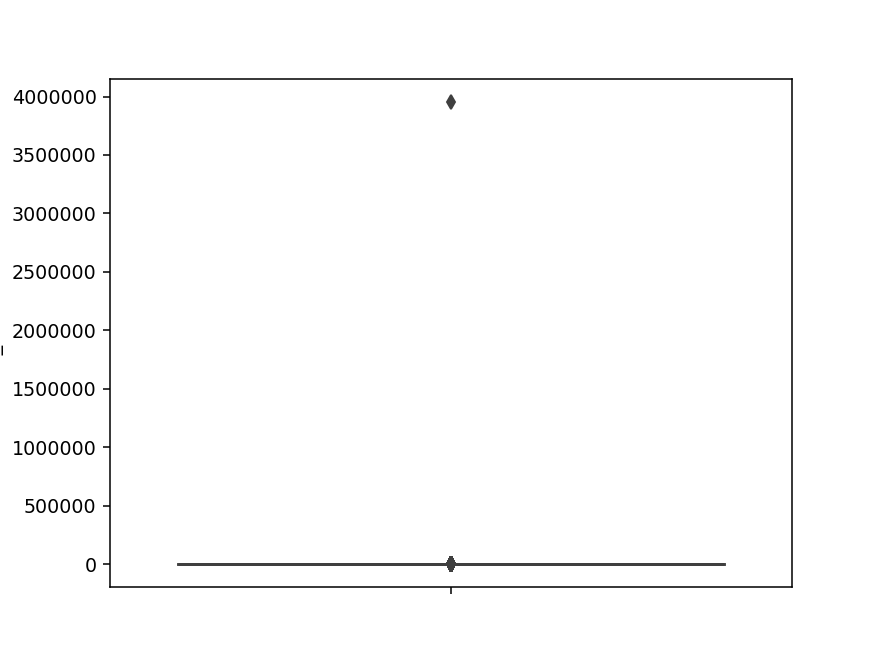

In [40]:
# Upto now we have removed the outliers based on trip durations, cab speeds, and trip distances
# lets try if there are any outliers in based on the total fare
# box-plot on fare
sns.boxplot(y="total_amount", data =frame_with_durations_modified)
plt.show()

In [41]:
#calculating total fare amount values on percentile with interval 10
for i in range(0,100,10):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is -242.55
10 percentile value is 6.3
20 percentile value is 7.8
30 percentile value is 8.8
40 percentile value is 9.8
50 percentile value is 11.16
60 percentile value is 12.8
70 percentile value is 14.8
80 percentile value is 18.3
90 percentile value is 25.8
100 percentile value is  3950611.6


In [42]:
#calculating total fare amount values on 90th-100th percentile with interval 1
for i in range(90,100):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 25.8
91 percentile value is 27.3
92 percentile value is 29.3
93 percentile value is 31.8
94 percentile value is 34.8
95 percentile value is 38.53
96 percentile value is 42.6
97 percentile value is 48.13
98 percentile value is 58.13
99 percentile value is 66.13
100 percentile value is  3950611.6


In [43]:
#calculating total fare amount values on 99-100th percentile with interval 0.1
for i in np.arange(0.0, 1.0, 0.1):
    var = frame_with_durations_modified["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 66.13
99.1 percentile value is 68.13
99.2 percentile value is 69.6
99.3 percentile value is 69.6
99.4 percentile value is 69.73
99.5 percentile value is 69.75
99.6 percentile value is 69.76
99.7 percentile value is 72.58
99.8 percentile value is 75.35
99.9 percentile value is 88.28
100 percentile value is  3950611.6


<b>Observation:-</b> As even the 99.9th percentile value doesnt look like an outlier,as there is not much difference between the 99.8th percentile and 99.9th percentile, we move on to do graphical analyis

<IPython.core.display.Javascript object>


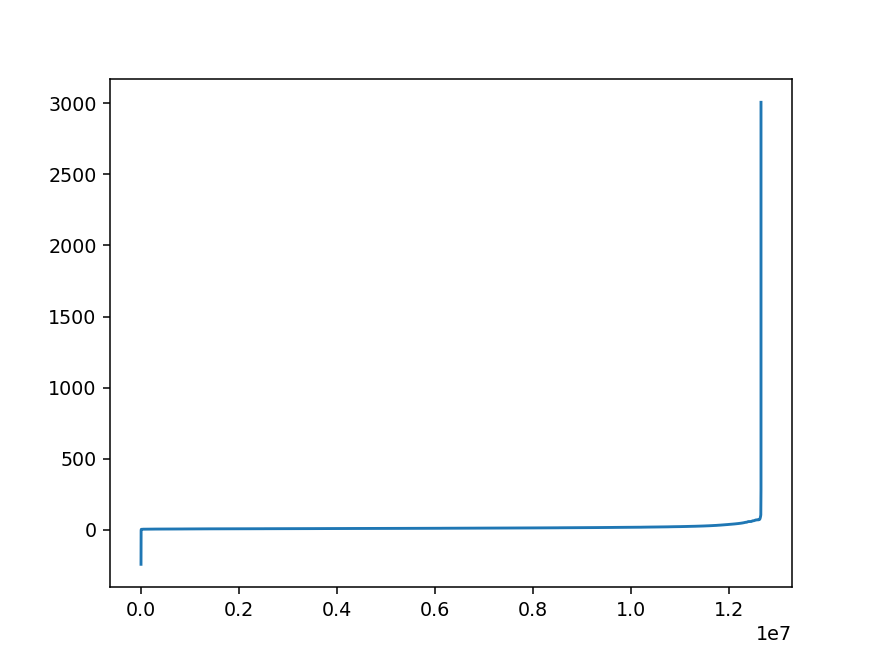

In [53]:
# Below plot shows us the fare values(sorted) to find a sharp increase to remove those values as outliers
# Plot total fare excluding last two value
plt.plot(var[:-2])
plt.show()

In [54]:
var

array([-2.4255000e+02, -2.1080000e+02, -1.7630000e+02, ...,
        3.0063500e+03,  4.0093000e+03,  3.9506116e+06])

<IPython.core.display.Javascript object>


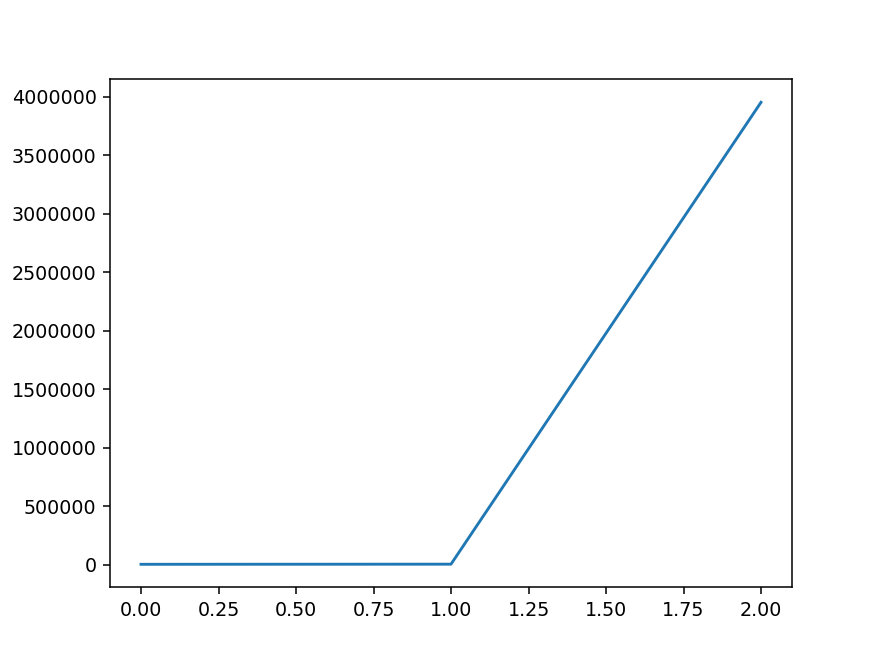

In [56]:
# A very sharp increase in fare values can be seen 
# plotting last three total fare values, and we can observe there is share increase in the values
plt.plot(var[-3:])
plt.show()

<IPython.core.display.Javascript object>


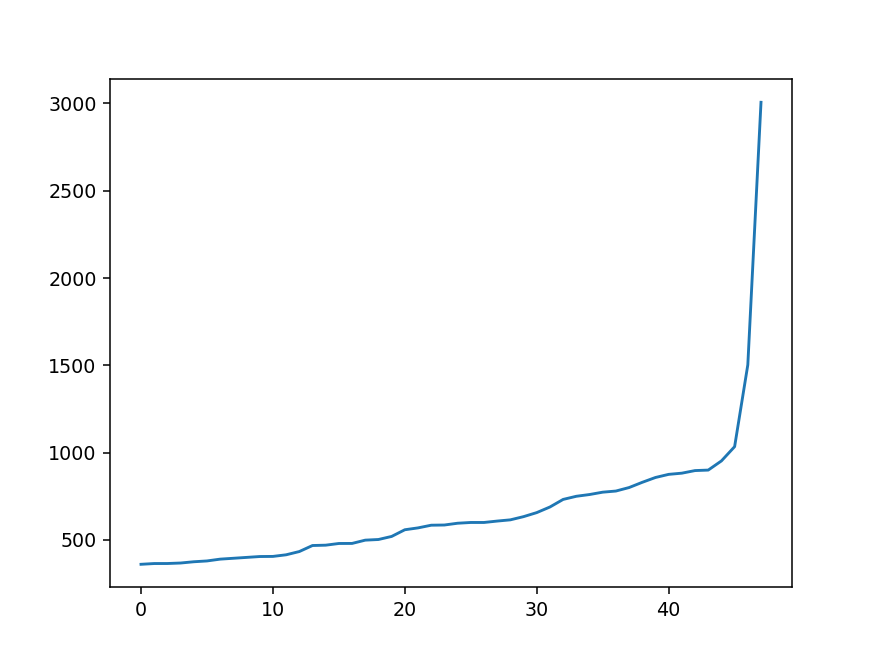

In [57]:
# Now looking at values not including the last two points, we again find a drastic increase at around 1000 fare value
# we plot last 50 values excluding last two values
plt.plot(var[-50:-2])
plt.show()

## Remove all outliers/erronous points.

In [58]:
#removing all outliers based on our univariate analysis above
def remove_outliers(new_frame):

    
    a = new_frame.shape[0]
    print ("Number of pickup records = ",a)
    temp_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    b = temp_frame.shape[0]
    print ("Number of outlier coordinates lying outside NY boundaries:",(a-b))

    
    temp_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    c = temp_frame.shape[0]
    print ("Number of outliers from trip times analysis:",(a-c))
    
    
    temp_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    d = temp_frame.shape[0]
    print ("Number of outliers from trip distance analysis:",(a-d))
    
    temp_frame = new_frame[(new_frame.Speed <= 45.31) & (new_frame.Speed >= 0)]
    e = temp_frame.shape[0]
    print ("Number of outliers from speed analysis:",(a-e))
    
    temp_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    f = temp_frame.shape[0]
    print ("Number of outliers from fare analysis:",(a-f))
    
    
    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
                       (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
                       ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
                       (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    new_frame = new_frame[(new_frame.Speed < 45.31) & (new_frame.Speed > 0)]
    new_frame = new_frame[(new_frame.total_amount <1000) & (new_frame.total_amount >0)]
    
    print ("Total outliers removed",a - new_frame.shape[0])
    print ("---")
    return new_frame

In [59]:
print ("Removing outliers in the month of Jan-2015")
print ("----")
frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
print("fraction of data points that remain after removing outliers", float(len(frame_with_durations_outliers_removed))/len(frame_with_durations))

Removing outliers in the month of Jan-2015
----
Number of pickup records =  12748986
Number of outlier coordinates lying outside NY boundaries: 293919
Number of outliers from trip times analysis: 23889
Number of outliers from trip distance analysis: 92597
Number of outliers from speed analysis: 36690
Number of outliers from fare analysis: 5275
Total outliers removed 377910
---
fraction of data points that remain after removing outliers 0.9703576425607495


# Data-preperation
## Clustering/Segmentation

In [61]:
# Store the coodirnates of the pickup
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values
neighbours = []

# Define Cluster using KMean algorithm
def find_clusters(increment):
    '''
    Fit and Predict the cluster using KMean Cluster Algorithm
    
    Return:
    cluster_centers : cluster center values
    cluster_len : number of clusters
    '''
    # Initiate and fit the coordinates of pickup
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000,random_state=42).fit(coords)
    
    # Predict the cluster number after fit the cluster
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    
    # Store the cluster center values
    cluster_centers = kmeans.cluster_centers_
    
    # Store the number of clusters
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    less2 = []
    more2 = []
    min_dist=1000
    for i in range(0, cluster_len):
        nice_points = 0
        wrong_points = 0
        for j in range(0, cluster_len):
            # If both 'i' and 'j' have different cluster center value, we find the distance between two clusters value
            # We know that cluster center value contain two part (X,Y) or (Lat., Long.)
            if j!=i:
                # "gpxpy.geo.haversine_distance" gives distance between two latitudes and longitudes in meters
                distance = gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],cluster_centers[j][0], cluster_centers[j][1])
                # Convert it into miles
                min_dist = min(min_dist,distance/(1.60934*1000))
                # If distance (in miles) is less than 2 then increament nice point
                # Otherwise increment wrong point
                if (distance/(1.60934*1000)) <= 2:
                    nice_points +=1
                else:
                    wrong_points += 1
        # If both 'i' and 'j' have a same cluster center value then the distance will be 0
        # Append the nice point value which tells that the two cluster center value is less than 2 miles
        # Otherwise the wrong point value which tells that the two cluster center value is greater than 2 miles
        less2.append(nice_points)
        more2.append(wrong_points)
    neighbours.append(less2)
    print ("On choosing a cluster size of ",cluster_len,"\nAvg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2):", np.ceil(sum(less2)/len(less2)), "\nAvg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2):", np.ceil(sum(more2)/len(more2)),"\nMin inter-cluster distance = ",min_dist,"\n---")

# Create Cluster
for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    find_min_distance(cluster_centers, cluster_len)

On choosing a cluster size of  10 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 2.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 8.0 
Min inter-cluster distance =  1.0945442325142543 
---
On choosing a cluster size of  20 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 4.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 16.0 
Min inter-cluster distance =  0.7131298007387813 
---
On choosing a cluster size of  30 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 22.0 
Min inter-cluster distance =  0.5185088176172206 
---
On choosing a cluster size of  40 
Avg. Number of Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. Number of Clusters outside the vicinity (i.e. intercluster-distance > 2): 32.0 
Min inter-cluster distance 

#### Inference:
- The main objective was to find a optimal min. distance (Which roughly estimates to the radius of a cluster) between the clusters which we got was 40

In [62]:
# So we choose 40 clusters which contain minimum intercluster distance 0.5

# Instantiate and fit with 40 clusters using the KMeans
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000,random_state=42).fit(coords)

# Store the pickup cluster value as per KMean predict value
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

In [63]:
# Plot the cluster centers
cluster_centers = kmeans.cluster_centers_
cluster_len = len(cluster_centers)
map_osm = folium.Map(location=[40.734695, -73.990372], tiles='Stamen Toner')
for i in range(cluster_len):
    folium.Marker(list((cluster_centers[i][0],cluster_centers[i][1])), popup=(str(cluster_centers[i][0])+str(cluster_centers[i][1]))).add_to(map_osm)
map_osm

<IPython.core.display.Javascript object>


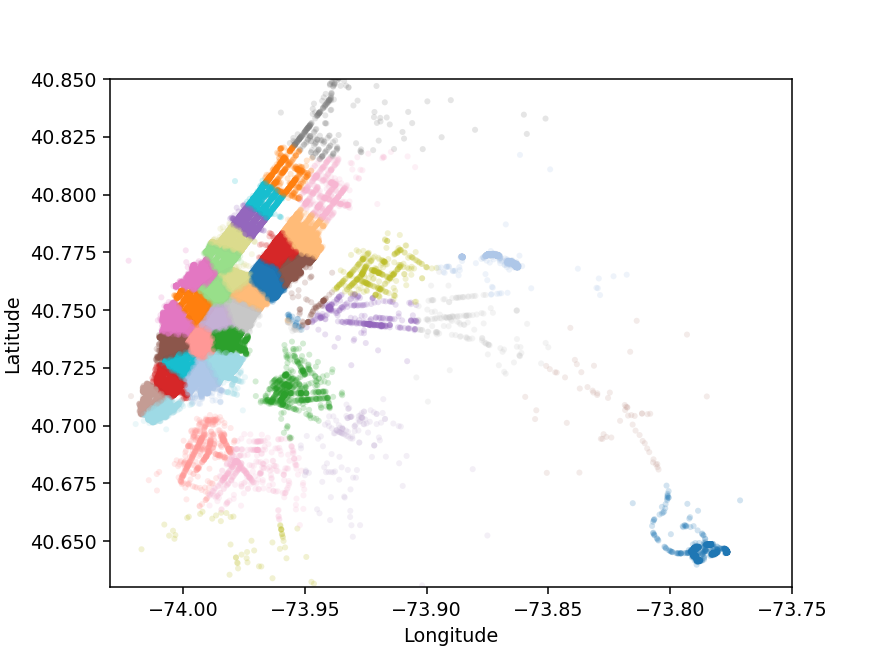

In [64]:
# Visualising the clusters on a map
def plot_clusters(frame):
    # Define cluster long. bound value
    city_long_border = (-74.03, -73.75)
    # Define cluster lat. bound value
    city_lat_border = (40.63, 40.85)
    
    # Taking 100k as pickup cluster values
    fig, ax = plt.subplots(ncols=1, nrows=1)
    ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10, lw=0,
               c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

plot_clusters(frame_with_durations_outliers_removed)

## Time Binning

In [75]:
# Refer:https://www.unixtimestamp.com/
# Unix TimeStamp : DateTime

# 1420070400 : 2015-01-01 00:00:00 
# 1422748800 : 2015-02-01 00:00:00 
# 1425168000 : 2015-03-01 00:00:00
# 1427846400 : 2015-04-01 00:00:00 
# 1430438400 : 2015-05-01 00:00:00 
# 1433116800 : 2015-06-01 00:00:00

# 1451606400 : 2016-01-01 00:00:00 
# 1454284800 : 2016-02-01 00:00:00 
# 1456790400 : 2016-03-01 00:00:00
# 1459468800 : 2016-04-01 00:00:00 
# 1462060800 : 2016-05-01 00:00:00 
# 1464739200 : 2016-06-01 00:00:00

def add_pickup_bins(frame,month,year):
    unix_pickup_times=[i for i in frame['pickup_times'].values]
    unix_times = [[1420070400,1422748800,1425168000,1427846400,1430438400,1433116800],\
                    [1451606400,1454284800,1456790400,1459468800,1462060800,1464739200]]
    
    start_pickup_unix=unix_times[year-2015][month-1]
    # convert_time_to_unix('2015-01-01 00:00:00') -> 1420050600
    # from website (https://www.unixtimestamp.com/index.php) with same '2015-01-01 00:00:00' -> 1420070400
    # There is differ among them. So we subtract both of them, we get -> -19800
    # These are in seconds, to convert into minutes and also since we are doing time binning with 10 mins
    # So, 10 mins means 600 seconds, so divide by 600, we get -> -33
    # Now add 33 in order to get neutral to both timestamp
    tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
    frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame

In [76]:
# Making pickup bins
jan_2015_frame = add_pickup_bins(frame_with_durations_outliers_removed,1,2015)

In [79]:
# Grouping by pickup cluster and pickup bins
jan_2015_groupby = jan_2015_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()

In [80]:
jan_2015_groupby.head()

trip_distance
pickup_cluster pickup_bins               
0              1                       89
               2                      191
               3                      300
               4                      288
               5                      318

In [82]:
# Now we cleaned data and prepared data for the month 2015,

# now do the same operations for months Jan, Feb, March of 2016
# 1. get the dataframe which inlcudes only required colums
# 2. Adding Trip Times, Speed, Unix Timestamp of pickup_time
# 4. Remove the outliers- Trip duration, Speed, Trip Duration, Total Fare
# 5. add pickup_cluster to each data point
# 6. add pickup_bin (index of 10min interval to which that trip belongs to)
# 7. group by data, based on 'pickup_cluster' and 'pickup_bin'

# Data Preparation for the months of Jan,Feb and March 2016
def datapreparation(month,kmeans,month_no,year_no):
    
    print('Data Preparation for {0} {1}'.format(month_no,year_no))
    
    print ("Return with trip times..")

    frame_with_durations = return_with_trip_times(month)
    
    print ("Remove outliers..")
    frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
    
    print ("Estimating clusters..")
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

    print ("Final groupbying..")
    final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed,month_no,year_no)
    final_groupby_frame = final_updated_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()
    
    return final_updated_frame,final_groupby_frame

In [83]:
month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv')
month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv')
month_mar_2016 = dd.read_csv('yellow_tripdata_2016-03.csv')

In [84]:
jan_2016_frame,jan_2016_groupby = datapreparation(month_jan_2016,kmeans,1,2016)
feb_2016_frame,feb_2016_groupby = datapreparation(month_feb_2016,kmeans,2,2016)
mar_2016_frame,mar_2016_groupby = datapreparation(month_mar_2016,kmeans,3,2016)

Data Preparation for 1 2016
Return with trip times..
Dask Compute
Remove outliers..
Number of pickup records =  10906858
Number of outlier coordinates lying outside NY boundaries: 214677
Number of outliers from trip times analysis: 27190
Number of outliers from trip distance analysis: 79742
Number of outliers from speed analysis: 31018
Number of outliers from fare analysis: 4991
Total outliers removed 297784
---
Estimating clusters..
Final groupbying..
Data Preparation for 2 2016
Return with trip times..
Dask Compute
Remove outliers..
Number of pickup records =  11382049
Number of outlier coordinates lying outside NY boundaries: 223161
Number of outliers from trip times analysis: 27670
Number of outliers from trip distance analysis: 81902
Number of outliers from speed analysis: 31866
Number of outliers from fare analysis: 5476
Total outliers removed 308177
---
Estimating clusters..
Final groupbying..
Data Preparation for 3 2016
Return with trip times..
Dask Compute
Remove outliers..
Nu

## Smoothing

In [88]:
# Gets the unique bins where pickup values are present for each each reigion

# for each cluster region, we will collect all the indices of 10min intervals in which the pickups are happened
# we got an observation that there are some pickup_bins that doesn't have any pickups

def return_unq_pickup_bins(frame):
    values = []
    for i in range(0,40):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['pickup_bins']))
        list_unq.sort()
        values.append(list_unq)
    return values

In [89]:
# for every month we get all indices of 10min intervals in which atleast one pickup got happened

# Jan
jan_2015_unique = return_unq_pickup_bins(jan_2015_frame)
jan_2016_unique = return_unq_pickup_bins(jan_2016_frame)

# Feb
feb_2016_unique = return_unq_pickup_bins(feb_2016_frame)

# March
mar_2016_unique = return_unq_pickup_bins(mar_2016_frame)

In [112]:
# Janurary has 31 days, each day is 24 hrs, and each hrs is 60 mins. Since we are taking 10mins intervals, we divide by 10
# i.e. 31*24*60/10
print('There are {} indices of 10mins inderval in Janurary'.format(31*24*60/10))

There are 4464.0 indices of 10mins inderval in Janurary


In [113]:
# For each cluster, number of 10min intervals with 0 pickups
# Subtract number of indices in each cluster from Total number of each ckuster in Janurary(4464)

for i in range(40):
    print("for the ",i,"th cluster number of 10min intervals with zero pickups: ",4464 - len(set(jan_2015_unique[i])))
    print('-'*60)

for the  0 th cluster number of 10min intervals with zero pickups:  27
------------------------------------------------------------
for the  1 th cluster number of 10min intervals with zero pickups:  151
------------------------------------------------------------
for the  2 th cluster number of 10min intervals with zero pickups:  34
------------------------------------------------------------
for the  3 th cluster number of 10min intervals with zero pickups:  427
------------------------------------------------------------
for the  4 th cluster number of 10min intervals with zero pickups:  43
------------------------------------------------------------
for the  5 th cluster number of 10min intervals with zero pickups:  51
------------------------------------------------------------
for the  6 th cluster number of 10min intervals with zero pickups:  23
------------------------------------------------------------
for the  7 th cluster number of 10min intervals with zero pickups:  32
---

there are two ways to fill up these values
<ul>
<li> Fill the missing value with 0's</li>
<li> Fill the missing values with the avg values
<ul>
<li> Case 1:(values missing at the start)  <br>Ex1: \_ \_ \_ x =>ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br> Ex2: \_ \_ x => ceil(x/3), ceil(x/3), ceil(x/3) </li>
<li> Case 2:(values missing in middle) <br>Ex1: x \_ \_ y => ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4) <br> Ex2: x \_ \_ \_ y => ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5) </li>
<li> Case 3:(values missing at the end)  <br>Ex1: x \_ \_ \_  => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br> Ex2: x \_  => ceil(x/2), ceil(x/2) </li>
</ul>
</li>
</ul>

In [123]:
# Fill 0 where there is no pickup in each and every cluster

def fill_missing(count_values,values):
    smoothed_regions=[]
    ind=0
    # Loop of each cluster value
    for r in range(0,40):
        smoothed_bins=[]
        # Total of indices 10 mins interval in Janurary
        for i in range(4464):
            # If values is present in the cluster. Then No effect of that value
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
                ind+=1
            else:
                # If value is not present in the cluster, then filled with 0
                smoothed_bins.append(0)
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

In [124]:
# Fill the avg value where there is no pickup in each and every cluster

def smoothing(count_values,values):
    smoothed_regions=[] # stores list of final smoothed values of each reigion
    ind=0
    repeat=0 
    smoothed_value=0
    for r in range(0,40):
        smoothed_bins=[] #stores the final smoothed values
        repeat=0
        for i in range(4464):
            if repeat!=0: # prevents iteration for a value which is already visited/resolved
                repeat-=1
                continue
            if i in values[r]: #checks if the pickup-bin exists 
                smoothed_bins.append(count_values[ind]) # appends the value of the pickup bin if it exists
            else:
                if i!=0:
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]: #searches for the left-limit or the pickup-bin value which has a pickup value
                            continue
                        else:
                            right_hand_limit=j
                            break
                    if right_hand_limit==0:
                    #Case 1: When we have the last/last few values are found to be missing,hence we have no right-limit here
                        smoothed_value=count_values[ind-1]*1.0/((4463-i)+2)*1.0                               
                        for j in range(i,4464):                              
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(4463-i)
                        ind-=1
                    else:
                    #Case 2: When we have the missing values between two known values
                        smoothed_value=(count_values[ind-1]+count_values[ind])*1.0/((right_hand_limit-i)+2)*1.0             
                        for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat=(right_hand_limit-i)
                else:
                    #Case 3: When we have the first/first few values are found to be missing,hence we have no left-limit here
                    right_hand_limit=0
                    for j in range(i,4464):
                        if  j not in values[r]:
                            continue
                        else:
                            right_hand_limit=j
                            break
                    smoothed_value=count_values[ind]*1.0/((right_hand_limit-i)+1)*1.0
                    for j in range(i,right_hand_limit+1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                    repeat=(right_hand_limit-i)
            ind+=1
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

In [125]:
#Filling Missing values of Jan-2015 with 0
# here in jan_2015_groupby dataframe the trip_distance represents the number of pickups that are happened
jan_2015_fill = fill_missing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

#Smoothing Missing values of Jan-2015
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)

In [126]:
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*30*60/10 = 4320

# for each cluster we will have 4464 values, therefore 40*4464 = 178560 (length of the jan_2015_fill)
print("number of 10min intervals among all the clusters ",len(jan_2015_fill))

number of 10min intervals among all the clusters  178560


<IPython.core.display.Javascript object>


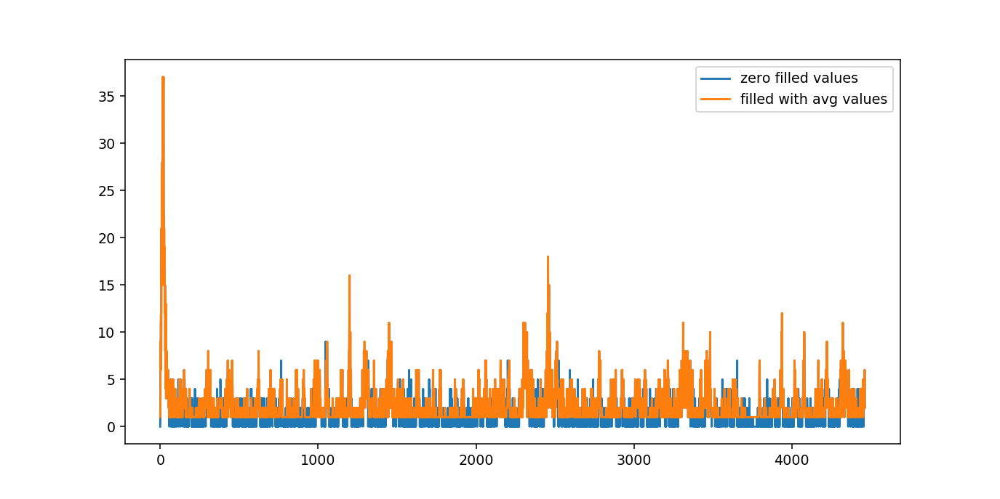

In [129]:
# Smoothing vs Filling
# sample plot that shows two variations of filling missing values
# we have taken the number of pickups for cluster region 33
plt.figure(figsize=(10,5))
plt.plot(jan_2015_fill[4464*33:4464*34-1], label="zero filled values")
plt.plot(jan_2015_smooth[4464*33:4464*34-1], label="filled with avg values")
plt.legend()
plt.show()

In [120]:
# Jan-2015 data is smoothed, Jan,Feb & March 2016 data missing values are filled with zero
jan_2015_smooth = smoothing(jan_2015_groupby['trip_distance'].values,jan_2015_unique)
jan_2016_smooth = fill_missing(jan_2016_groupby['trip_distance'].values,jan_2016_unique)
feb_2016_smooth = fill_missing(feb_2016_groupby['trip_distance'].values,feb_2016_unique)
mar_2016_smooth = fill_missing(mar_2016_groupby['trip_distance'].values,mar_2016_unique)

# Making list of all the values of pickup data in every bin for a period of 3 months and storing them region-wise 
regions_cum = []

# a =[1,2,3]
# b = [2,3,4]
# a+b = [1, 2, 3, 2, 3, 4]

# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups 
# that are happened for three months in 2016 data

for i in range(0,40):
    regions_cum.append(jan_2016_smooth[4464*i:4464*(i+1)]+feb_2016_smooth[4176*i:4176*(i+1)]+mar_2016_smooth[4464*i:4464*(i+1)])

# print(len(regions_cum))
# 40
# print(len(regions_cum[0]))
# 13104

## Time series and Fourier Transforms

<IPython.core.display.Javascript object>


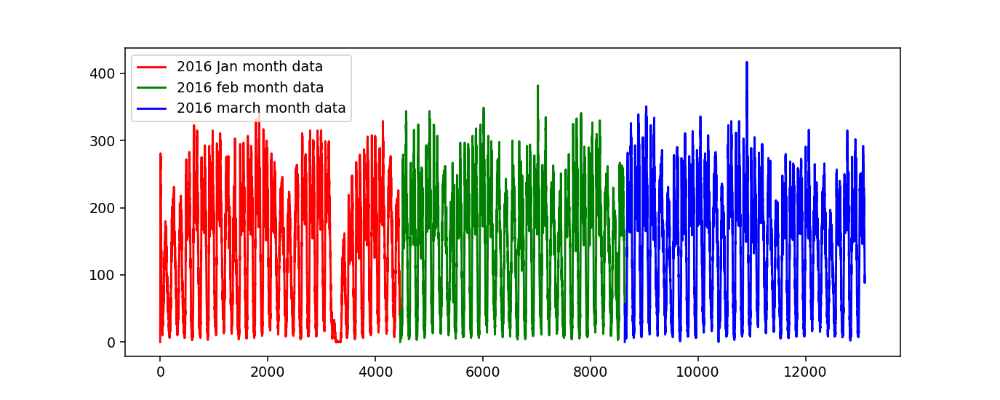

<IPython.core.display.Javascript object>


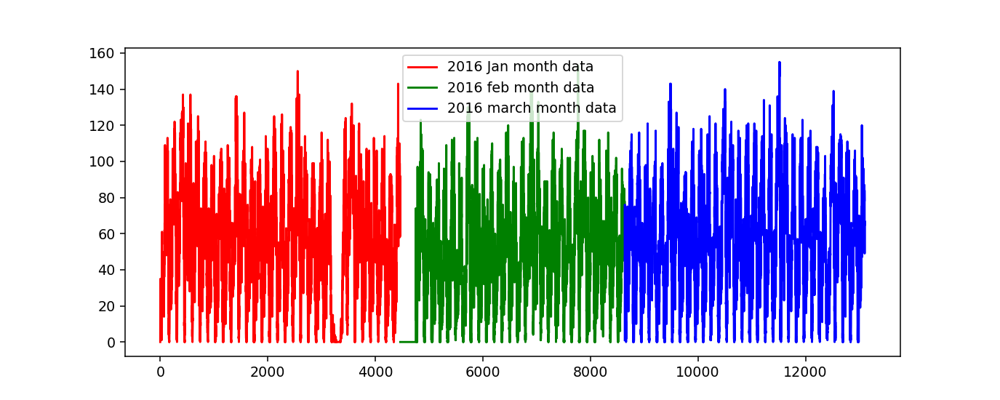

<IPython.core.display.Javascript object>


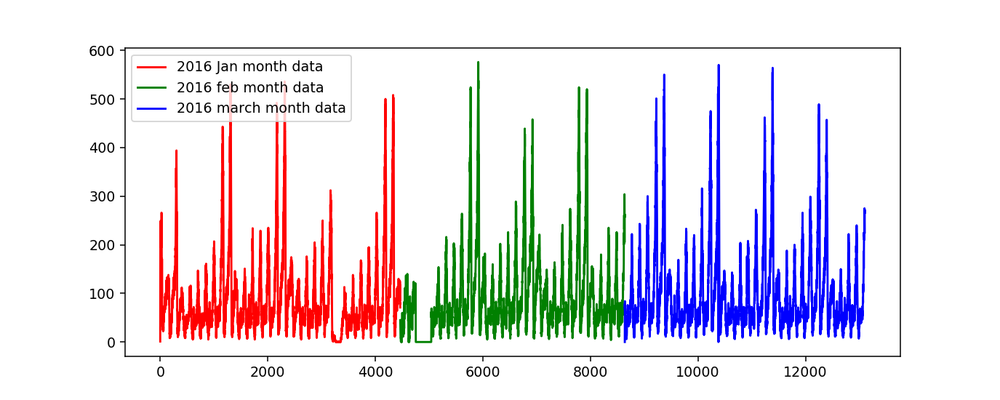

<IPython.core.display.Javascript object>


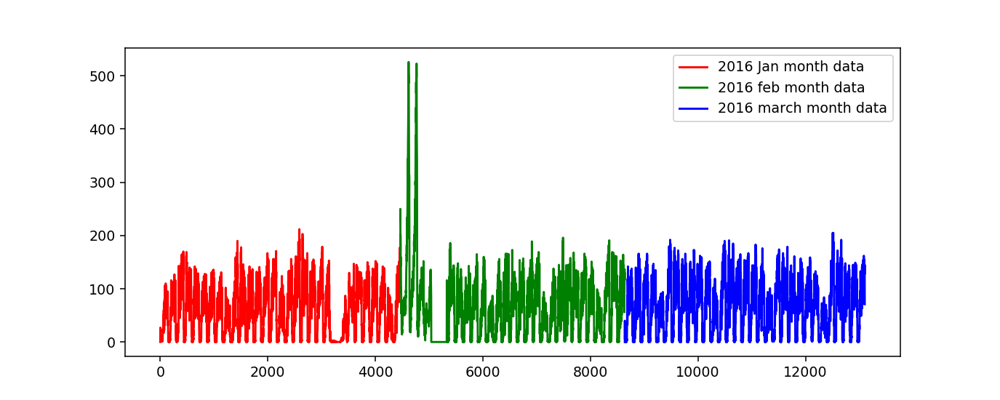

<IPython.core.display.Javascript object>


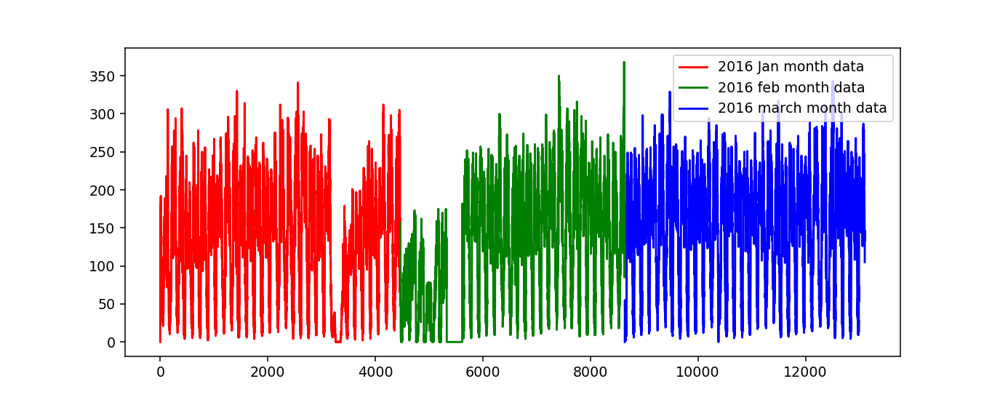

<IPython.core.display.Javascript object>


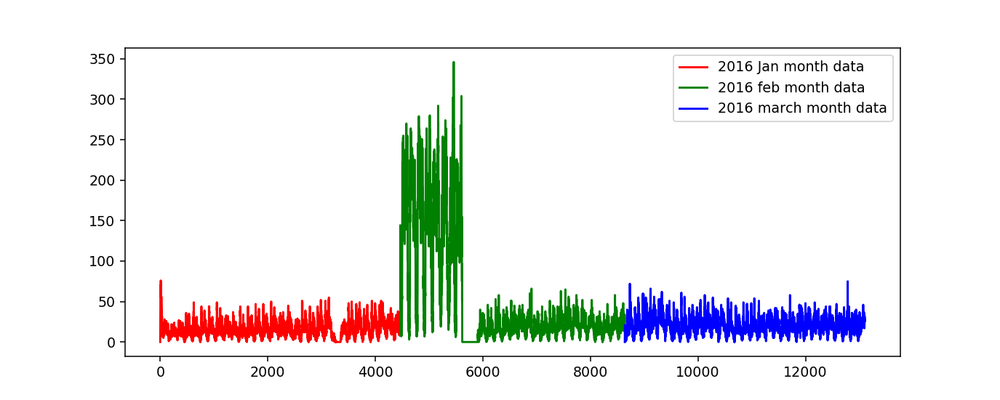

<IPython.core.display.Javascript object>


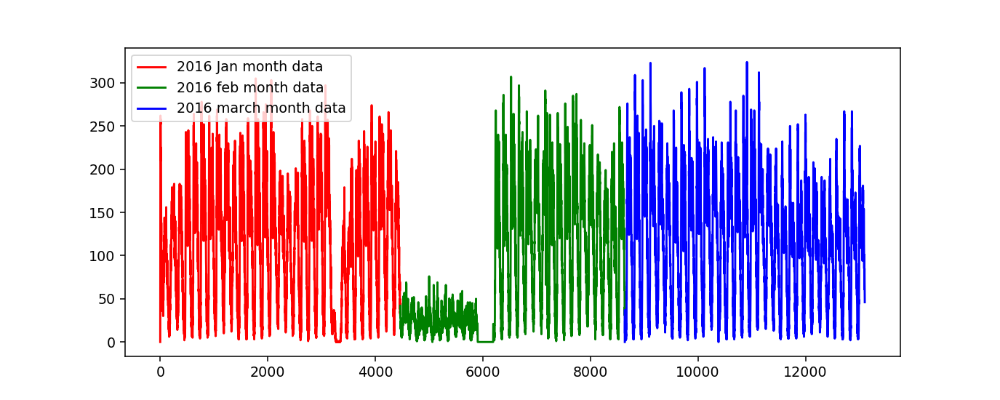

<IPython.core.display.Javascript object>


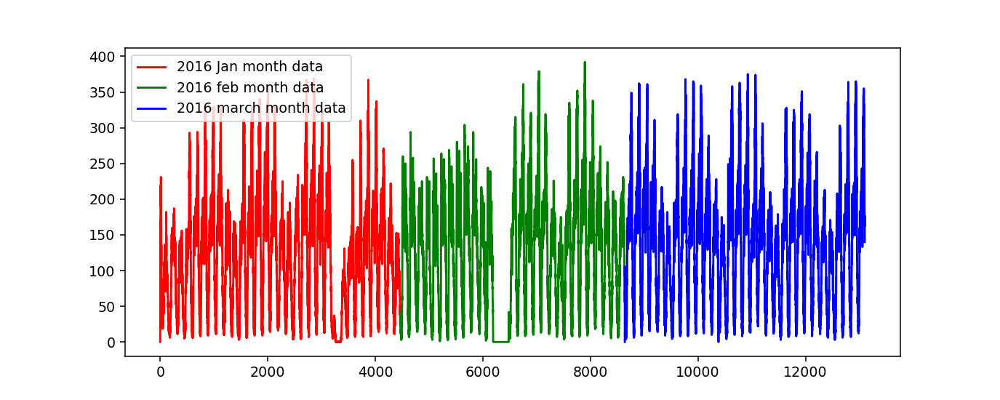

<IPython.core.display.Javascript object>


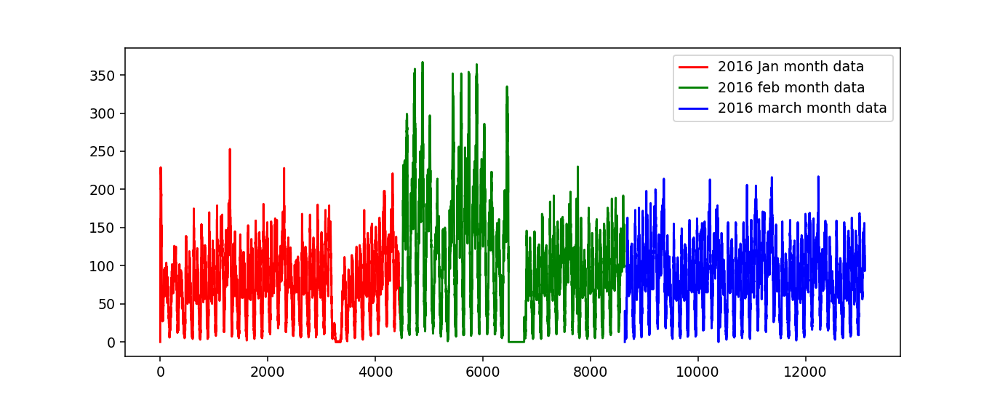

<IPython.core.display.Javascript object>


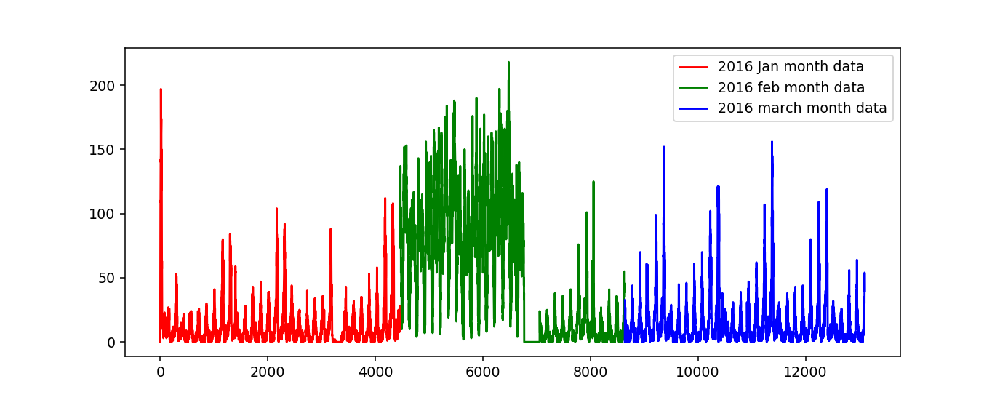

<IPython.core.display.Javascript object>


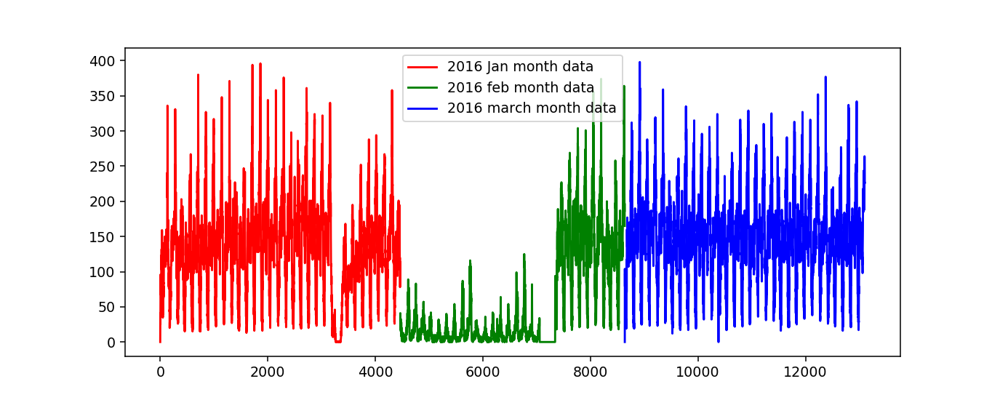

<IPython.core.display.Javascript object>


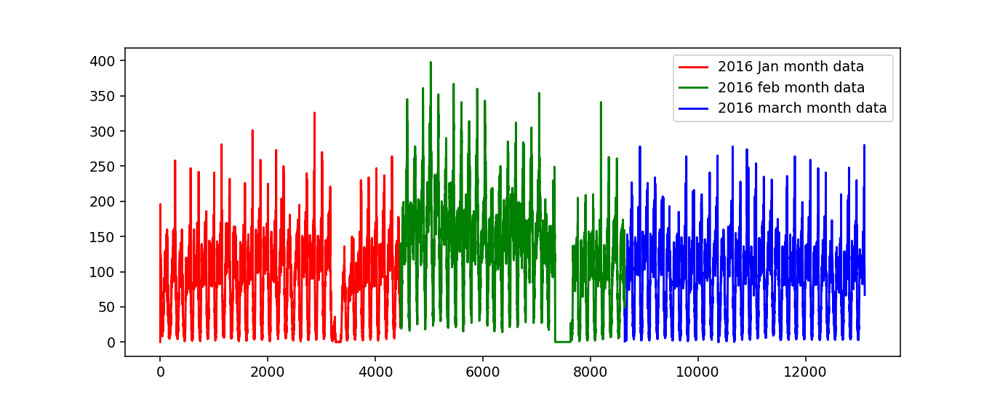

<IPython.core.display.Javascript object>


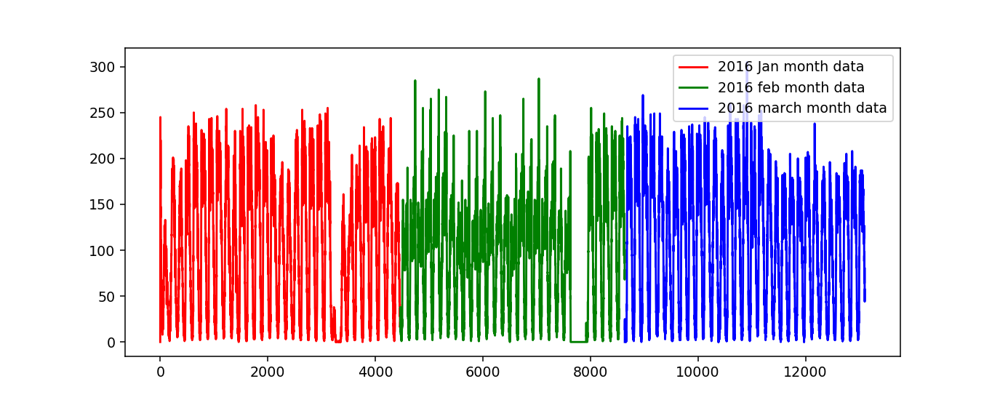

<IPython.core.display.Javascript object>


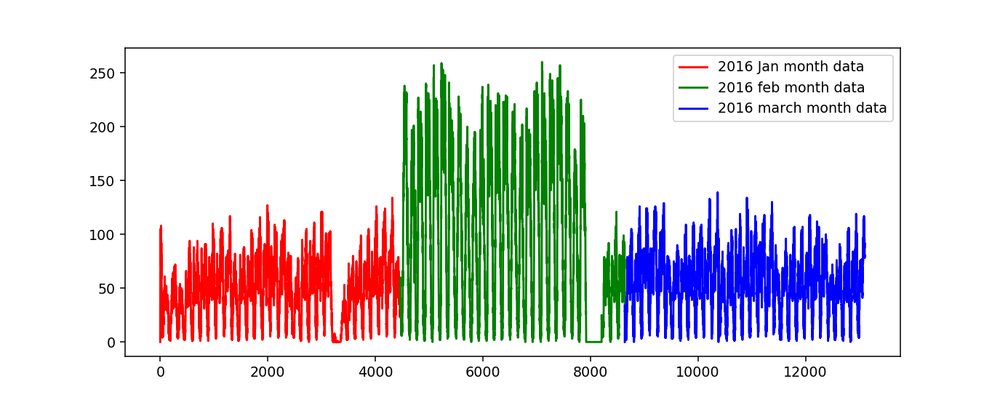

<IPython.core.display.Javascript object>


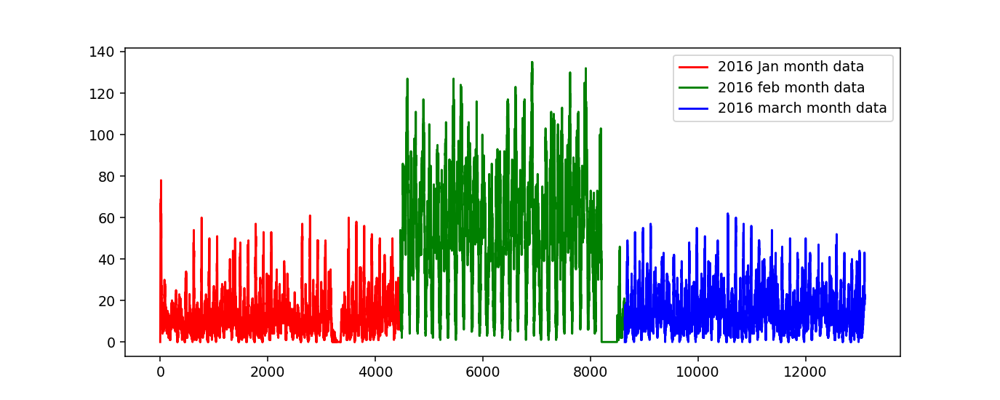

<IPython.core.display.Javascript object>


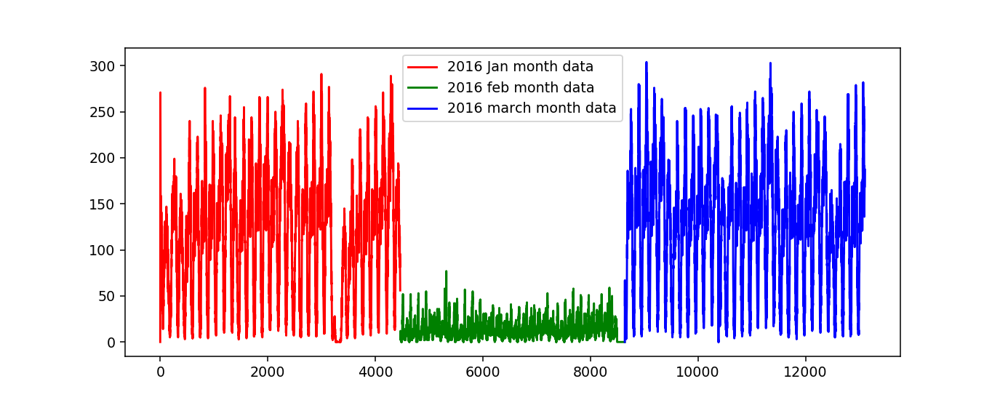

<IPython.core.display.Javascript object>


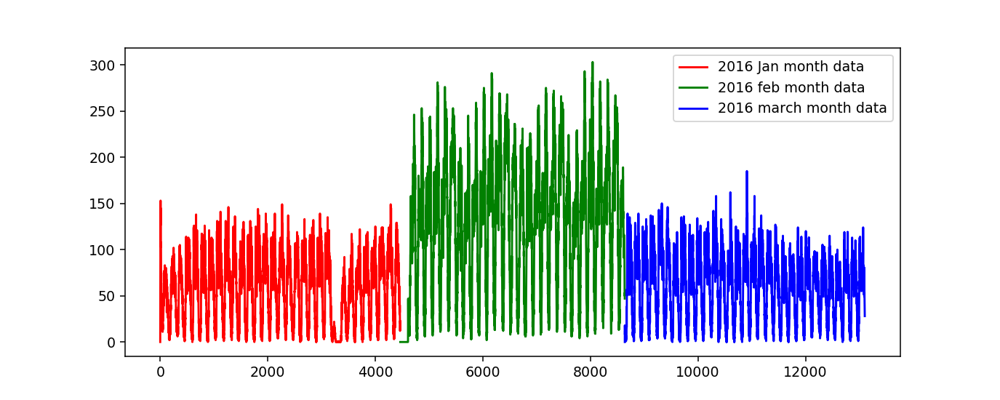

<IPython.core.display.Javascript object>


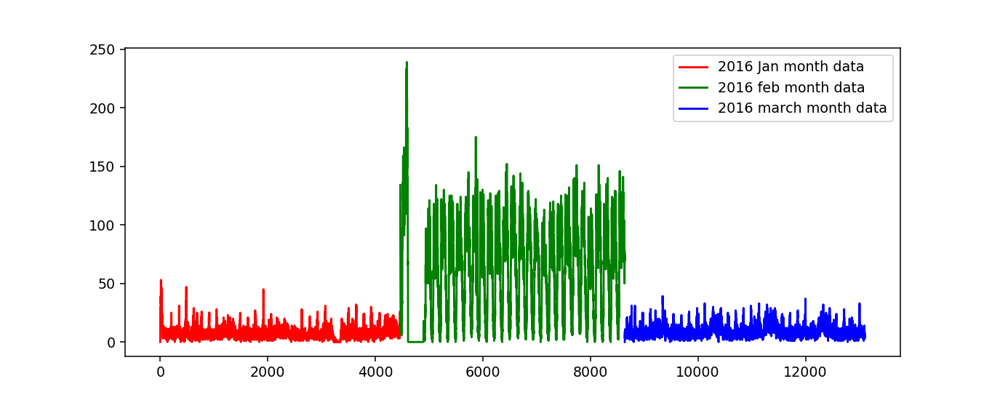

<IPython.core.display.Javascript object>


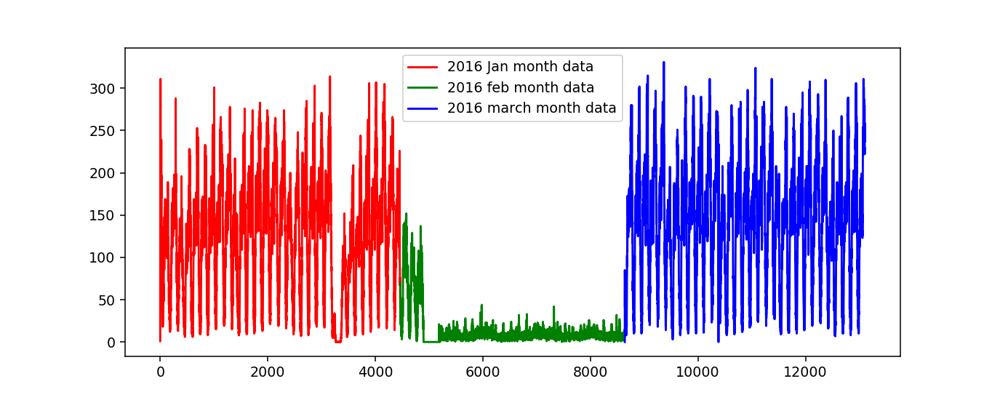

<IPython.core.display.Javascript object>


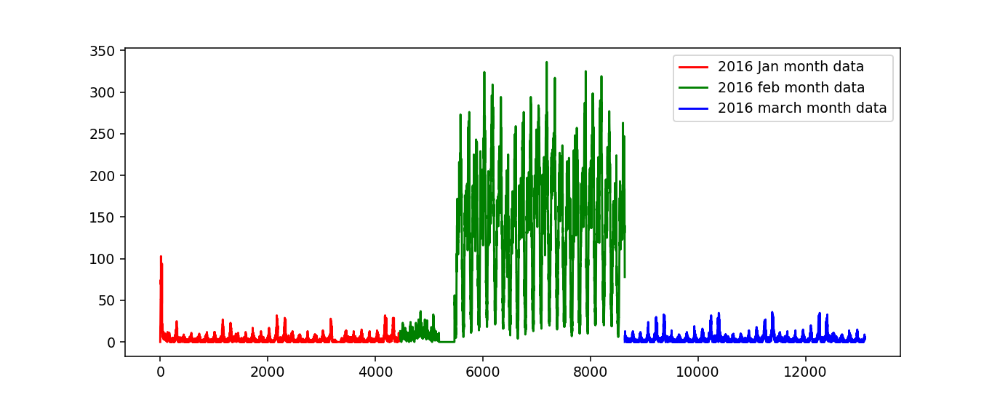

<IPython.core.display.Javascript object>


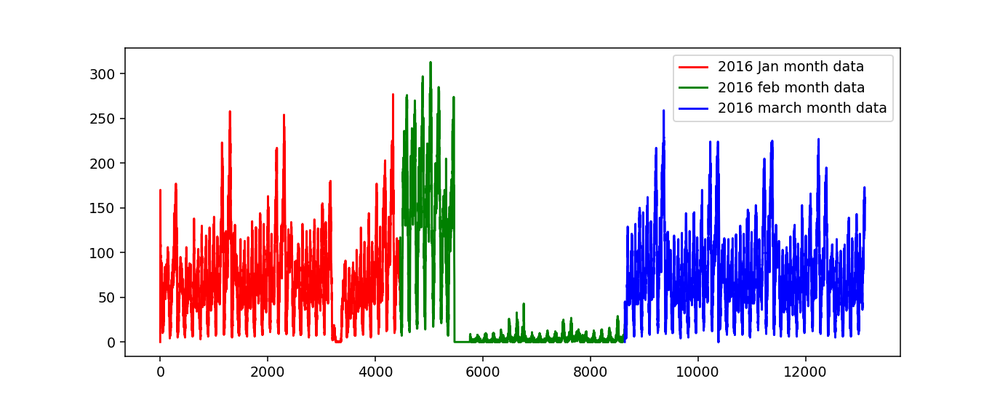

<IPython.core.display.Javascript object>


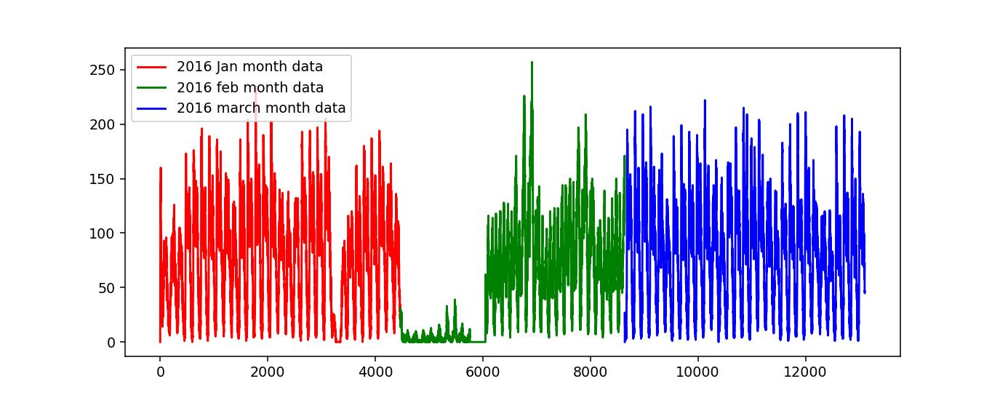

<IPython.core.display.Javascript object>


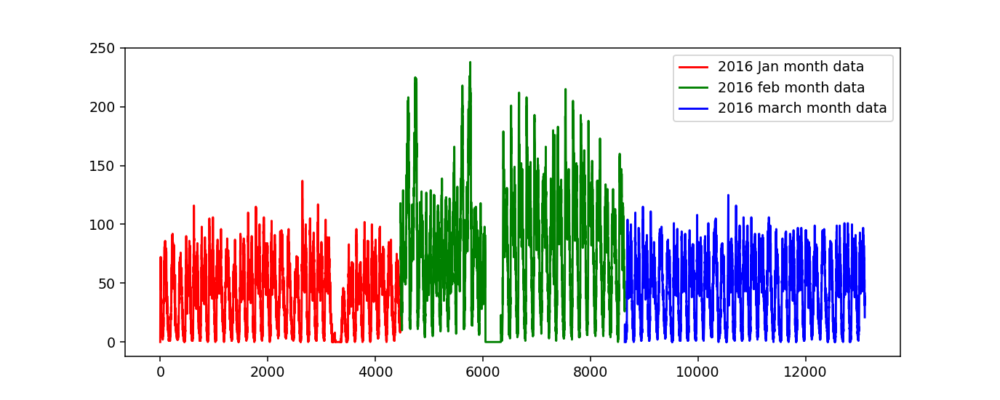

<IPython.core.display.Javascript object>


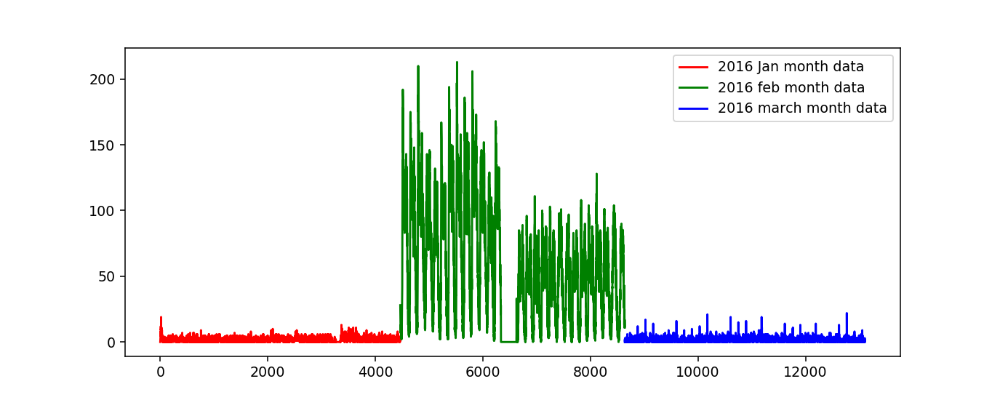

<IPython.core.display.Javascript object>


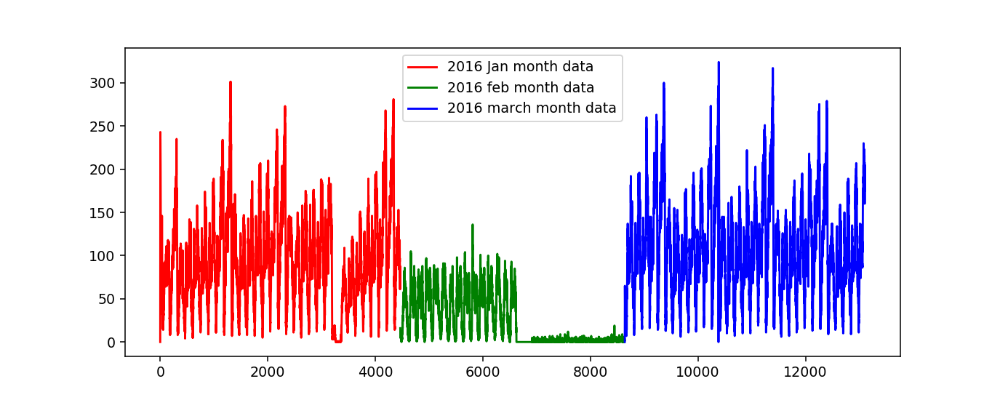

<IPython.core.display.Javascript object>


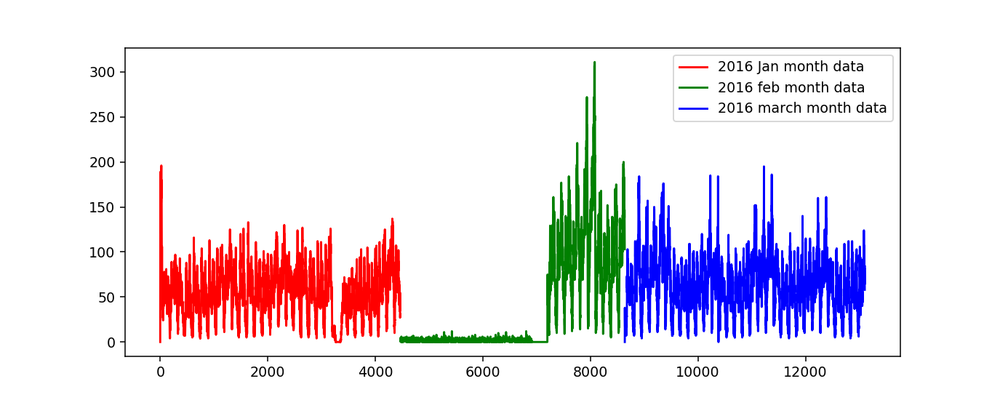

<IPython.core.display.Javascript object>


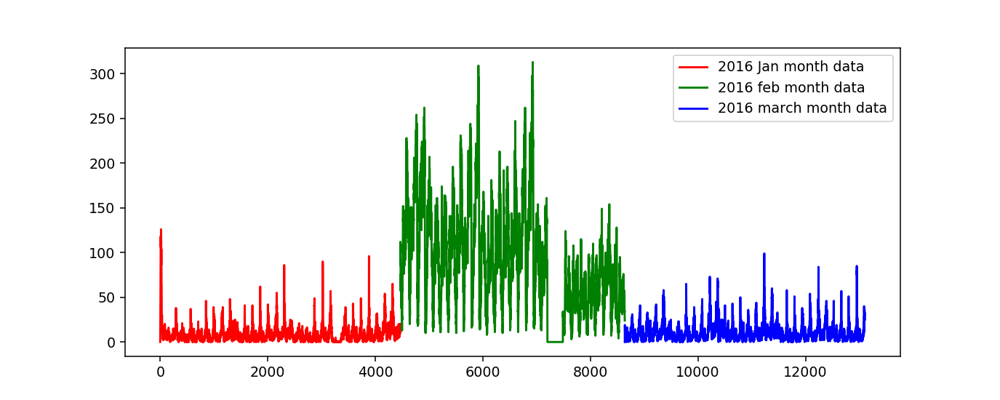

<IPython.core.display.Javascript object>


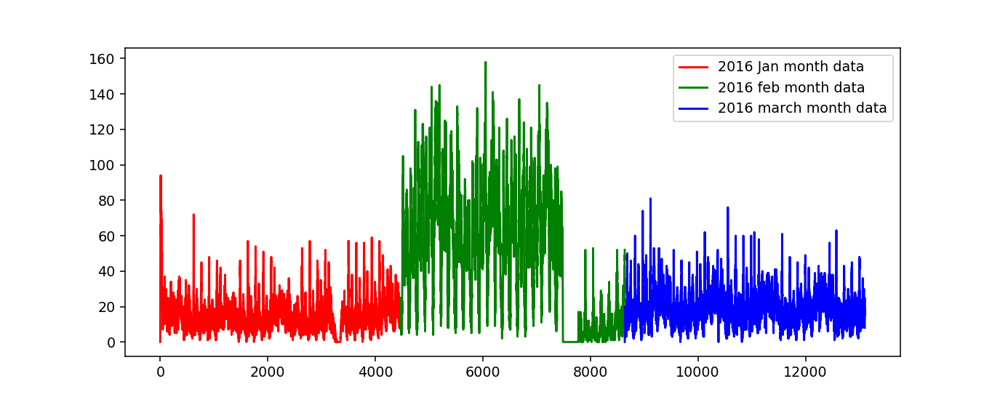

<IPython.core.display.Javascript object>


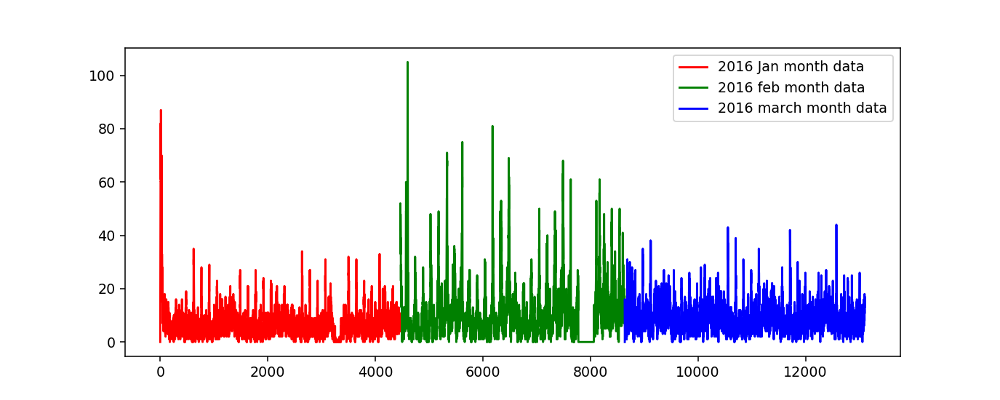

<IPython.core.display.Javascript object>


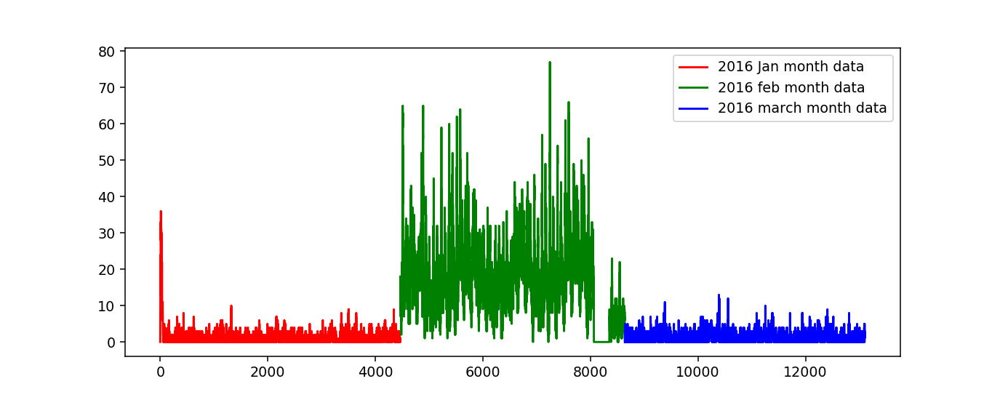

<IPython.core.display.Javascript object>


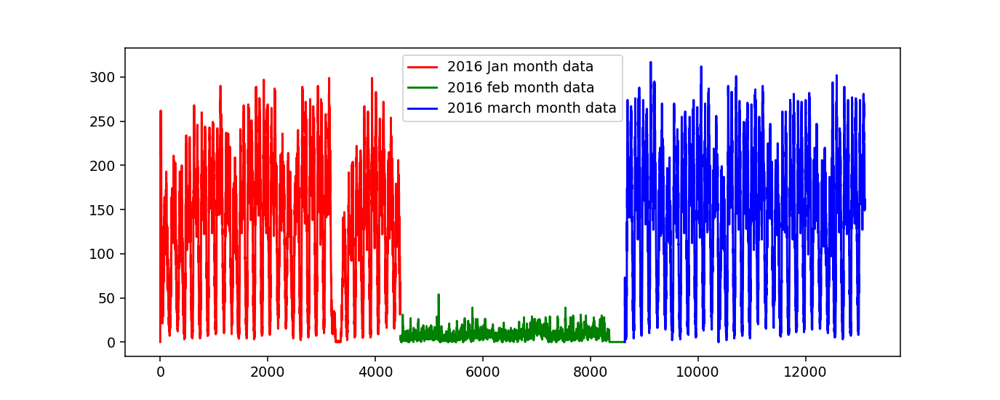

<IPython.core.display.Javascript object>


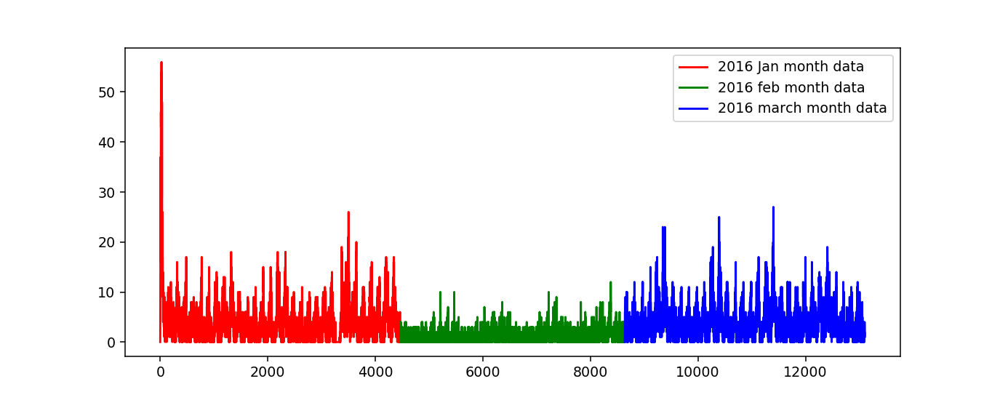

<IPython.core.display.Javascript object>


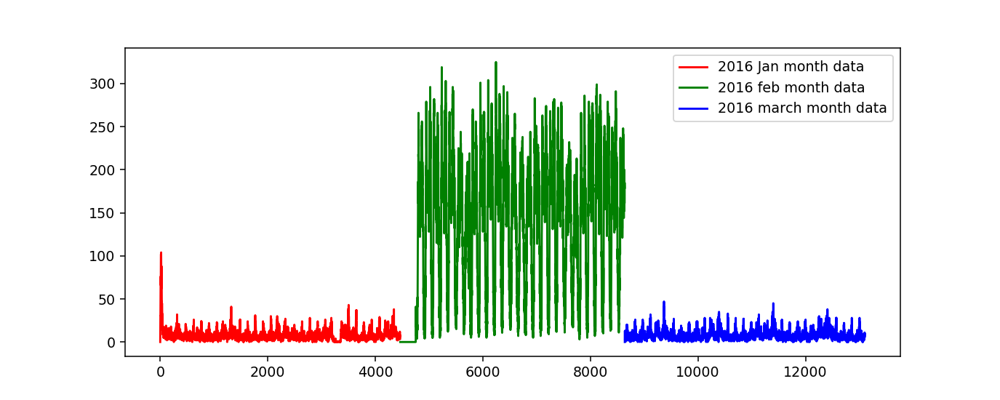

<IPython.core.display.Javascript object>


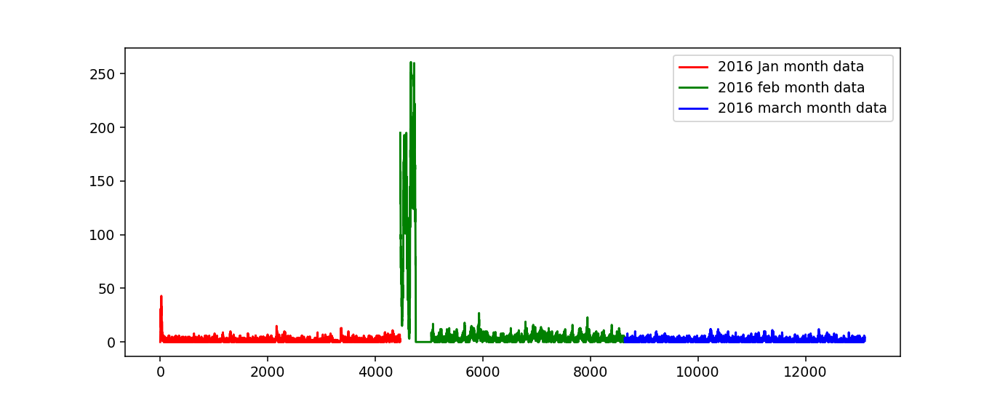

<IPython.core.display.Javascript object>


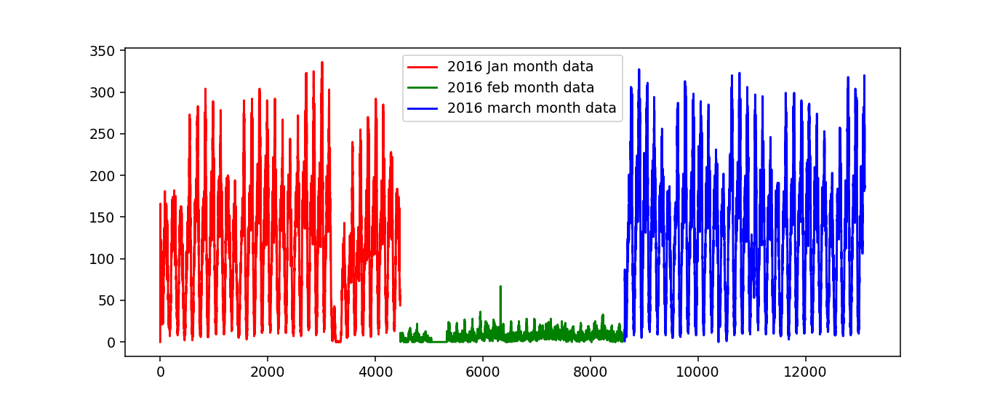

<IPython.core.display.Javascript object>


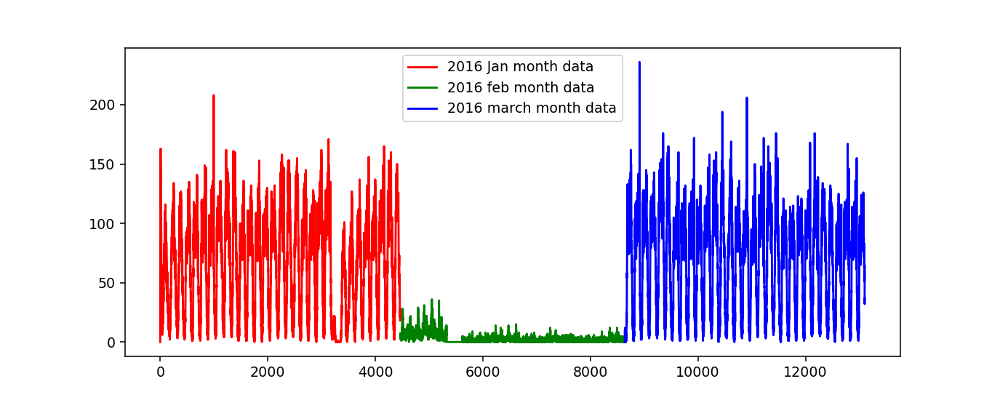

<IPython.core.display.Javascript object>


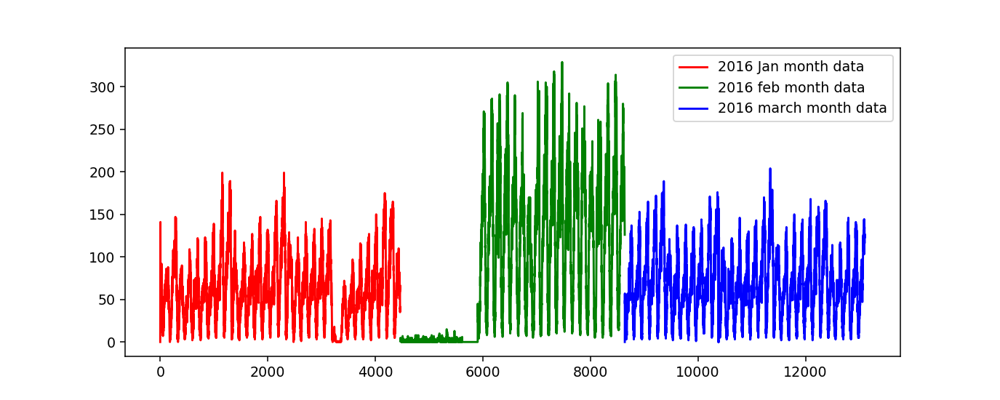

<IPython.core.display.Javascript object>


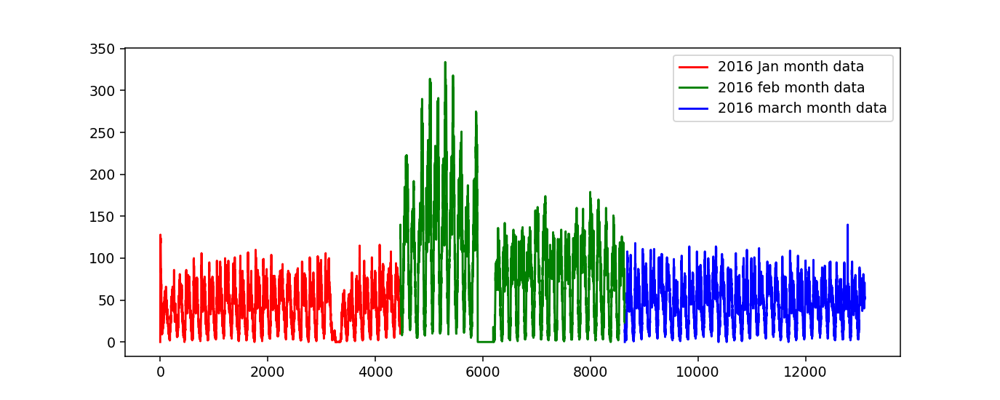

<IPython.core.display.Javascript object>


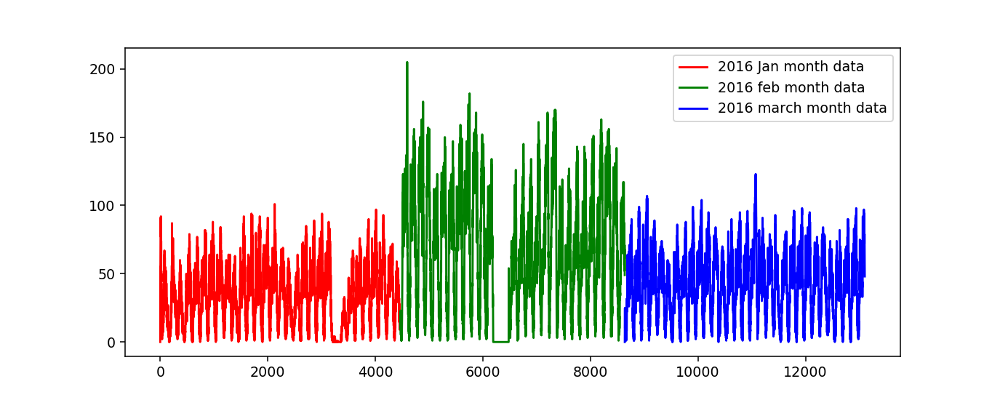

<IPython.core.display.Javascript object>


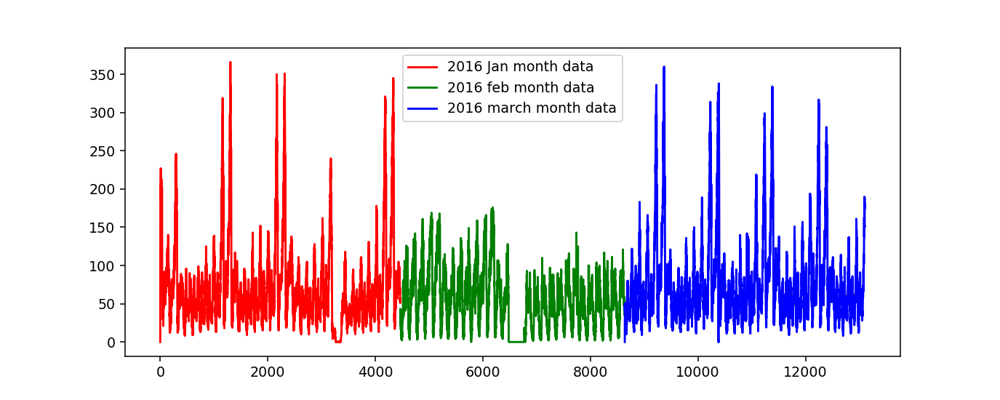

In [130]:
def uniqueish_color():
    """There're better ways to generate unique colors, but this isn't awful."""
    return plt.cm.gist_ncar(np.random.random())
first_x = list(range(0,4464))
second_x = list(range(4464,8640))
third_x = list(range(8640,13104))

for i in range(40):
    plt.figure(figsize=(10,4))
    plt.plot(first_x,regions_cum[i][:4464], color='r', label='2016 Jan month data')
    plt.plot(second_x,regions_cum[i][4464:8640], color='g', label='2016 feb month data')
    plt.plot(third_x,regions_cum[i][8640:], color='b', label='2016 march month data')
    plt.legend()
    plt.show()

<IPython.core.display.Javascript object>


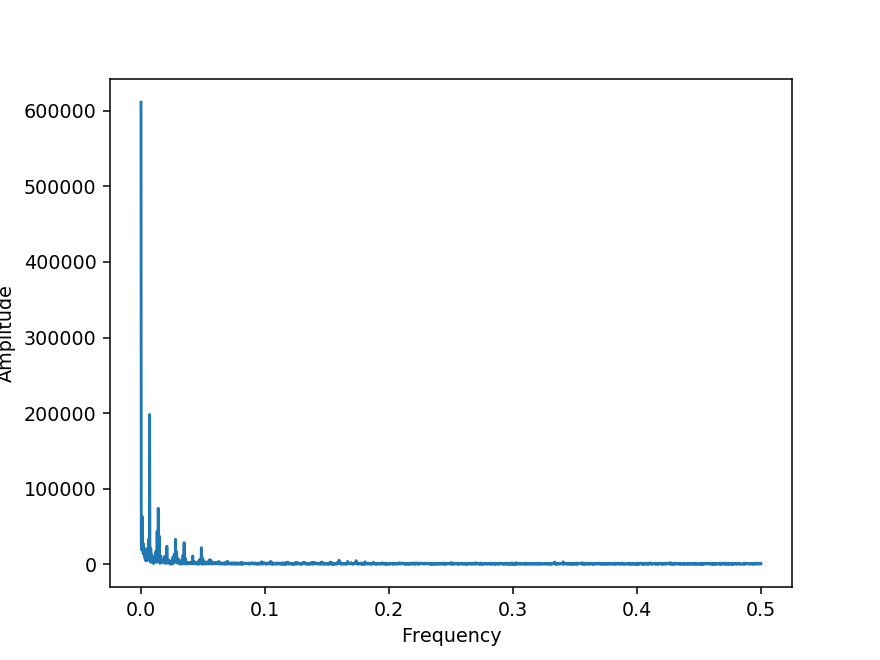

In [131]:
# getting peaks: https://blog.ytotech.com/2015/11/01/findpeaks-in-python/
# read more about fft function : https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fft.html
Y = np.fft.fft(np.array(jan_2016_smooth)[0:4460])

# read more about the fftfreq: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html  
freq = np.fft.fftfreq(4460, 1)
n = len(freq)
plt.figure()
plt.plot( freq[:int(n/2)], np.abs(Y)[:int(n/2)] )
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

## ---

In [132]:
#Preparing the Dataframe only with x(i) values as jan-2015 data and y(i) values as jan-2016
# Given -> Jan 2015 Smoothing
# Prediction -> Jan 2016 Smoothing
# Ratios -> Prediction/Given


ratios_jan = pd.DataFrame()
ratios_jan['Given']=jan_2015_smooth
ratios_jan['Prediction']=jan_2016_smooth
ratios_jan['Ratios']=ratios_jan['Prediction']*1.0/ratios_jan['Given']*1.0

## Modelling: Baseline Models

Now we get into modelling in order to forecast the pickup densities for the months of Jan, Feb and March of 2016 for which we are using multiple models with two variations 
1. Using Ratios of the 2016 data to the 2015 data i.e $\begin{align} R_{t} = P^{2016}_{t} / P^{2015}_{t} \end{align}$
2. Using Previous known values of the 2016 data itself to predict the future values

### Simple Moving Averages
The First Model used is the Moving Averages Model which uses the previous n values in order to predict the next value <br> 

Using Ratio Values - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )/n \end{align}$

In [138]:
(ratios_jan['Ratios'].values)

array([0.        , 2.08888889, 1.07853403, ..., 0.19655172, 0.17346939,
       0.17014925])

In [173]:
def MA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    error=[]
    predicted_values=[]
    window_size=3
    predicted_ratio_values=[]
    # There are 40 clusters and each cluster contain 4464 indices of 10 mins intervals
    for i in range(0,4464*40):
        # if i equals 4464, that means we moving to the next cluster region
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        
        # Initial ratio value R(t-1)
        predicted_ratio_values.append(predicted_ratio)
        
        # Add next predict value
        # Calculate as R(t-1)*P_2015(t-1)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        
        # Calculate error -> R(t)*P_2015(t) - P_2016(t)
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        
        if i+1>=window_size:
            # Sum of three previous ratio (as window size = 3): R(t-3)+R(t-2)+R(t-1)/3 (as n=3)
            predicted_ratio=sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)])/window_size
        else:
            # Sum of two previous ratio R(t-2)+R(t-1)/ 2 (as n=2)
            predicted_ratio=sum((ratios['Ratios'].values)[0:(i+1)])/(i+1)
            
    
    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = error
    
    # MAPE -> Avg Error / Avg P_2016 or more likely |P_2015-P_2016|/P_2016
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    # MSE -> Mean Square Error
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 3 is optimal for getting the best results using Moving Averages using previous Ratio values therefore we get $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3})/3 \end{align}$

Next we use the Moving averages of the 2016  values itself to predict the future value using $\begin{align}P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n \end{align}$

In [174]:
def MA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=1
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        # Add prediction value P_2016(t-1)
        predicted_values.append(predicted_value)
        
        # Find error: P_2016(t-1)-P_2016(t)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        
        if i+1>=window_size:
             # Sum of three previous predicted P(t-3)+P(t-2)+P(t-1)/3 (as n=3 or more)
            predicted_value=int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)])/window_size)
        else:
            # Sum of two previous predict P(t-2)+P(t-1)/ 2 (as n=2)
            predicted_value=int(sum((ratios['Prediction'].values)[0:(i+1)])/(i+1))
            
    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error
    
    # MAPE
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    
    # MSE
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 1 is optimal for getting the best results using Moving Averages using previous 2016 values therefore we get $\begin{align}P_{t} = P_{t-1} \end{align}$

### Weighted Moving Averages
The Moving Avergaes Model used gave equal importance to all the values in the window used, but we know intuitively that the future is more likely to be similar to the latest values and less similar to the older values. Weighted Averages converts this analogy into a mathematical relationship giving the highest weight while computing the averages to the latest previous value and decreasing weights to the subsequent older ones<br>

Weighted Moving Averages using Ratio Values - $\begin{align}R_{t} = ( N*R_{t-1} + (N-1)*R_{t-2} + (N-2)*R_{t-3} .... 1*R_{t-n} )/(N*(N+1)/2) \end{align}$

In [175]:
# Exactly same as simple mean but we add 'N' part only (in comment section) and rest of the section of code is same as 
# simple mean.

def WA_R_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.5
    error=[]
    predicted_values=[]
    window_size=5
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            # Here we are adding 'N' as windows size as per the formula
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Ratios'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
        else:
            sum_values=0
            sum_of_coeff=0
            # Here we are adding 'N' as windows size as per the formula
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Ratios'].values)[j-1]
                sum_of_coeff+=j
            predicted_ratio=sum_values/sum_of_coeff
            
    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    
    # MAPE
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    
    # MSE
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 5 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $\begin{align} R_{t} = ( 5*R_{t-1} + 4*R_{t-2} + 3*R_{t-3} + 2*R_{t-4} + R_{t-5} )/15 \end{align}$

Weighted Moving Averages using Previous 2016 Values - $\begin{align}P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2) \end{align}$

In [176]:
# Exactly same as simple mean but we add 'N' part only (in comment section) and rest of the section of code is same as 
# simple mean.

def WA_P_Predictions(ratios,month):
    predicted_value=(ratios['Prediction'].values)[0]
    error=[]
    predicted_values=[]
    window_size=2
    for i in range(0,4464*40):
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        
        if i+1>=window_size:
            sum_values=0
            sum_of_coeff=0
            # Here we are adding 'N' as windows size as per the formula
            for j in range(window_size,0,-1):
                sum_values += j*(ratios['Prediction'].values)[i-window_size+j]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)

        else:
            sum_values=0
            sum_of_coeff=0
            # Here we are adding 'N' as windows size as per the formula
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Prediction'].values)[j-1]
                sum_of_coeff+=j
            predicted_value=int(sum_values/sum_of_coeff)
    
    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    
    # MAPE
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    
    # MSE
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 2 is optimal for getting the best results using Weighted Moving Averages using previous 2016 values therefore we get $\begin{align} P_{t} = ( 2*P_{t-1} + P_{t-2} )/3 \end{align}$

### Exponential  Weighted Moving Averages
 https://en.wikipedia.org/wiki/Moving_average#Exponential_moving_average
Through weighted averaged we have satisfied the analogy of giving higher weights to the latest value and decreasing weights to the subsequent ones but we still do not know which is the correct weighting scheme as there are infinetly many possibilities in which we can assign weights in a non-increasing order and tune the the hyperparameter window-size. To simplify this process we use Exponential Moving Averages which is a more logical way towards assigning weights and at the same time also using an optimal window-size.

In exponential moving averages we use a single hyperparameter alpha $\begin{align}(\alpha)\end{align}$ which is a value between 0 & 1 and based on the value of the hyperparameter alpha the weights and the window sizes are configured.<br>
For eg. If $\begin{align}\alpha=0.9\end{align}$ then the number of days on which the value of the current iteration is based is~$\begin{align}1/(1-\alpha)=10\end{align}$ i.e. we consider values 10 days prior before we predict the value for the current iteration. Also the weights are assigned using $\begin{align}2/(N+1)=0.18\end{align}$ ,where N = number of prior values being considered, hence from this it is implied that the first or latest value is assigned a weight of 0.18 which keeps exponentially decreasing for the subsequent values.

$\begin{align}R^{'}_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}  \end{align}$

In [177]:
# Same as simple mean explaination code but one line of code change that is alpha( see comment section below)

def EA_R1_Predictions(ratios,month):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha=0.6
    error=[]
    predicted_values=[]
    predicted_ratio_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
                
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(int(((ratios['Given'].values)[i])*predicted_ratio))
        error.append(abs((math.pow(int(((ratios['Given'].values)[i])*predicted_ratio)-(ratios['Prediction'].values)[i],1))))
        
        # Here is the change with alpha parameter
        predicted_ratio = (alpha*predicted_ratio) + (1-alpha)*((ratios['Ratios'].values)[i])
    
    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    
    # MAPE
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    
    # MSE
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$

In [178]:
# Same as simple mean explaination code but one line of code change that is alpha( see comment section below)

def EA_P1_Predictions(ratios,month):
    predicted_value= (ratios['Prediction'].values)[0]
    alpha=0.3
    error=[]
    predicted_values=[]
    for i in range(0,4464*40):
        if i%4464==0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((math.pow(predicted_value-(ratios['Prediction'].values)[i],1))))
        
        # Here is the change with alpha parameter
        predicted_value =int((alpha*predicted_value) + (1-alpha)*((ratios['Prediction'].values)[i]))
    
    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    
    # MAPE
    mape_err = (sum(error)/len(error))/(sum(ratios['Prediction'].values)/len(ratios['Prediction'].values))
    
    # MSE
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios,mape_err,mse_err

In [179]:
mean_err=[0]*10
median_err=[0]*10
ratios_jan,mean_err[0],median_err[0]=MA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[1],median_err[1]=MA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[2],median_err[2]=WA_R_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[3],median_err[3]=WA_P_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[4],median_err[4]=EA_R1_Predictions(ratios_jan,'jan')
ratios_jan,mean_err[5],median_err[5]=EA_P1_Predictions(ratios_jan,'jan')

## Comparison between baseline models
We have chosen our error metric for comparison between models as <b>MAPE (Mean Absolute Percentage Error)</b> so that we can know that on an average how good is our model with predictions and <b>MSE (Mean Squared Error)</b> is also used so that we have a clearer understanding as to how well our forecasting model performs with outliers so that we make sure that there is not much of a error margin between our prediction and the actual value

In [184]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ['Error Metric Matrix (Forecasting Methods)','MAPE','MSE']
x.add_row(['Moving Averages (Ratios)',mean_err[0],median_err[0]])
x.add_row(['Moving Averages (2016 Values)',mean_err[1],median_err[1]])
x.add_row(['-'*10,'-'*10,'-'*10])
x.add_row(['Weighted Moving Averages (Ratios)',mean_err[2],median_err[2]])
x.add_row(['Weighted Moving Averages (2016 Values)',mean_err[3],median_err[3]])
x.add_row(['-'*10,'-'*10,'-'*10])
x.add_row(['Exponential Moving Averages (Ratios)',mean_err[4],median_err[4]])
x.add_row(['Exponential Moving Averages (2016 Values)',mean_err[5],median_err[5]])
print(x)

+-------------------------------------------+---------------------+--------------------+
| Error Metric Matrix (Forecasting Methods) |         MAPE        |        MSE         |
+-------------------------------------------+---------------------+--------------------+
|          Moving Averages (Ratios)         |  0.1800333374995782 | 420.17498319892474 |
|       Moving Averages (2016 Values)       | 0.14084424333358406 | 176.36434251792116 |
|                 ----------                |      ----------     |     ----------     |
|     Weighted Moving Averages (Ratios)     | 0.17665896194144748 |  402.71729390681   |
|   Weighted Moving Averages (2016 Values)  | 0.13346188366675546 | 164.36994287634408 |
|                 ----------                |      ----------     |     ----------     |
|    Exponential Moving Averages (Ratios)   |  0.1758940506966018 | 393.26883400537633 |
| Exponential Moving Averages (2016 Values) | 0.13309634752288466 | 161.75744287634407 |
+--------------------

<b>Plese Note:-</b> The above comparisons are made using Jan 2015 and Jan 2016 only
    
From the above matrix it is inferred that the best forecasting model for our prediction would be:-
$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$ i.e Exponential Moving Averages using 2016 Values

## Regression Models

## Prepare Data

In [325]:
# Preparing data to be split into train and test, The below prepares data in cumulative form which will be later split into test and train
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464=13104 values which represents the 
# number of pickups 
# that are happened for three months in 2016 data

# print(len(regions_cum))
# 40
# print(len(regions_cum[0]))
# 12960

# We take number of pickups that are happened in last 5 10mins intervals
number_of_time_stamps = 5

regions_cum = []
# number of 10min indices for jan 2015= 24*31*60/10 = 4464
# number of 10min indices for jan 2016 = 24*31*60/10 = 4464
# number of 10min indices for feb 2016 = 24*29*60/10 = 4176
# number of 10min indices for march 2016 = 24*31*60/10 = 4464
# regions_cum: it will contain 40 lists, each list will contain 4464+4176+4464 values which represents the number of pickups 
# that are happened for three months in 2016 data

for i in range(0,40):
    regions_cum.append(jan_2016_smooth[4464*i:4464*(i+1)])

# output variable
# it is list of lists
# it will contain number of pickups 13104 for each cluster
output = []


# tsne_lat will contain 13104-5=13099 times lattitude of cluster center for every cluster
# Ex: [[cent_lat 13099times],[cent_lat 13099times], [cent_lat 13099times].... 40 lists]
# it is list of lists
tsne_lat = []


# tsne_lon will contain 13104-5=13099 times logitude of cluster center for every cluster
# Ex: [[cent_long 13099times],[cent_long 13099times], [cent_long 13099times].... 40 lists]
# it is list of lists
tsne_lon = []

# we will code each day 
# sunday = 0, monday=1, tue = 2, wed=3, thur=4, fri=5,sat=6
# for every cluster we will be adding 13099 values, each value represent to which day of the week that pickup bin belongs to
# it is list of lists
tsne_weekday = []

# its an numbpy array, of shape (523960, 5)
# each row corresponds to an entry in out data
# for the first row we will have [f0,f1,f2,f3,f4] fi=number of pickups happened in i+1th 10min intravel(bin)
# the second row will have [f1,f2,f3,f4,f5]
# the third row will have [f2,f3,f4,f5,f6]
# and so on...
tsne_feature = []



tsne_feature = [0]*number_of_time_stamps
for i in range(0,40):
    tsne_lat.append([kmeans.cluster_centers_[i][0]]*4459)
    tsne_lon.append([kmeans.cluster_centers_[i][1]]*4459)
    
    # jan 1st 2016 is thursday, so we start our day from 4: "(int(k/144))%7+4"
    # our prediction start from 5th 10min interval since we need to have number of pickups that are happened in last 5 pickup bins
#     tsne_weekday.append([int(((int(k/144))%7+4)%7) for k in range(5,4464+4176+4464)])
    tsne_weekday.append([int(((int(k/144))%7+4)%7) for k in range(5,4464)])
    
    # regions_cum is a list of lists [[x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], .. 40 lsits]
    tsne_feature = np.vstack((tsne_feature, [regions_cum[i][r:r+number_of_time_stamps] for r in range(0,len(regions_cum[i])-number_of_time_stamps)]))
    output.append(regions_cum[i][5:])
tsne_feature = tsne_feature[1:]

In [328]:
len(tsne_lat[0])*len(tsne_lat) == tsne_feature.shape[0] == len(tsne_weekday)*len(tsne_weekday[0]) == 40*4459 == len(output)*len(output[0])

True

In [329]:
# Getting the predictions of exponential moving averages to be used as a feature in cumulative form

# upto now we computed 8 features for every data point that starts from 50th min of the day
# 1. cluster center lattitude
# 2. cluster center longitude
# 3. day of the week 
# 4. f_t_1: number of pickups that are happened previous t-1th 10min intravel
# 5. f_t_2: number of pickups that are happened previous t-2th 10min intravel
# 6. f_t_3: number of pickups that are happened previous t-3th 10min intravel
# 7. f_t_4: number of pickups that are happened previous t-4th 10min intravel
# 8. f_t_5: number of pickups that are happened previous t-5th 10min intravel

# from the baseline models we said the exponential weighted moving avarage gives us the best error
# we will try to add the same exponential weighted moving avarage at t as a feature to our data
# exponential weighted moving avarage => p'(t) = alpha*p'(t-1) + (1-alpha)*P(t-1) 
alpha=0.3

# it is a temporary array that store exponential weighted moving avarage for each 10min intravel, 
# for each cluster it will get reset
# for every cluster it contains 13104 values
predicted_values=[]

# it is similar like tsne_lat
# it is list of lists
# predict_list is a list of lists [[x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], .. 40 lsits]
predict_list = []
tsne_flat_exp_avg = []
for r in range(0,40):
    for i in range(0,4464):
        if i==0:
            predicted_value= regions_cum[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value =int((alpha*predicted_value) + (1-alpha)*(regions_cum[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values=[]

In [330]:
amp = np.abs(np.fft.fft(regions_cum[0][:4464]))
freq = np.abs(np.fft.fftfreq(4464, 1))
n = len(freq)
amp = np.abs(amp)[:int(n/2)]
amp_index = np.argsort(-amp)[1:]
amp[amp_index[:5]]

array([198750.13810661,  74119.00713267,  63518.65201163,  46273.56619363,
        42069.71553529])

## Top 5 FFT

In [380]:
amp_ = []
freq_ = []
for i in range(40):
    amp = np.abs(np.fft.fft(regions_cum[i][:4464]))
    freq = np.abs(np.fft.fftfreq(4464, 1))
    n = len(freq)
    amp = np.abs(amp)[:int(n/2)]
    
    # Return indices of descending order of amplitude value
    amp_index = np.argsort(-amp)[1:]
    a = []
    f = []
    
    # Top 5 amplitudes and frequencies
    a.append((amp[amp_index[:5]]))
    # Corresponding amplitude we store frequency
    f.append((freq[amp_index[:5]]))

    # It will be same FFT for every each cluster
    for k in range(4459):
        amp_.append(a)
        freq_.append(f)

## Train-Test Split
Before we start predictions using the tree based regression models we take 3 months of 2016 pickup data and split it such that for every region we have 70% data in train and 30% in test, ordered date-wise for every region

In [333]:
# train, test split : 70% 30% split
# Before we start predictions using the tree based regression models we take Jan months of 2016 pickup data 
# and split it such that for every region we have 70% data in train and 30% in test,
# ordered date-wise for every region

print("size of train data :", int(40*4459*0.7))
print("size of test data :", int(40*4459*0.3))

size of train data : 124851
size of test data : 53508


In [336]:
print('Size of train data in each cluster',int(4459*0.7))
print('Size of test data in each cluster',int(4459*0.3))

Size of train data in each cluster 3121
Size of test data in each cluster 1337


In [334]:
len(tsne_feature)

178360

In [337]:
# extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
train_features =  [tsne_feature[i*4459:(4459*i+3121)] for i in range(0,40)]

# temp = [0]*(12955 - 9068)
test_features = [tsne_feature[(4459*(i))+3121:4459*(i+1)] for i in range(0,40)]

In [339]:
print("Number of data clusters",len(train_features), "Number of data points in train data", len(train_features[0]), "Each data point contains", len(train_features[0][0]),"features")
print("Number of data clusters",len(train_features), "Number of data points in test data", len(test_features[0]), "Each data point contains", len(test_features[0][0]),"features")

Number of data clusters 40 Number of data points in train data 3121 Each data point contains 5 features
Number of data clusters 40 Number of data points in test data 1338 Each data point contains 5 features


In [341]:
# extracting first 9169 timestamp values i.e 70% of 13099 (total timestamps) for our training data
tsne_train_flat_lat = [i[:3121] for i in tsne_lat]
tsne_train_flat_lon = [i[:3121] for i in tsne_lon]
tsne_train_flat_weekday = [i[:3121] for i in tsne_weekday]
tsne_train_flat_output = [i[:3121] for i in output]
tsne_train_flat_exp_avg = [i[:3121] for i in predict_list]

In [407]:
train_freq = [freq_[i*4459:(4459*i+3121)] for i in range(40)]
train_amp = [amp_[i*4459:(4459*i+3121)] for i in range(40)]

In [342]:
# extracting the rest of the timestamp values i.e 30% of 12956 (total timestamps) for our test data
tsne_test_flat_lat = [i[3121:] for i in tsne_lat]
tsne_test_flat_lon = [i[3121:] for i in tsne_lon]
tsne_test_flat_weekday = [i[3121:] for i in tsne_weekday]
tsne_test_flat_output = [i[3121:] for i in output]
tsne_test_flat_exp_avg = [i[3121:] for i in predict_list]

In [408]:
test_freq = [freq_[(4459*i+3121):4459*(i+1)] for i in range(40)]
test_amp = [amp_[(4459*i+3121):4459*(i+1)] for i in range(40)]

In [417]:
np.array(train_freq[0]).shape, np.array(train_amp).shape

((3121, 1, 5), (40, 3121, 1, 5))

In [424]:
train_new_features = []
test_new_features = []
train_fft = []
train_ampt = []
test_fft = []
test_ampt = []
for i in range(40):
    train_new_features.extend(train_features[i])
    train_fft.extend(np.array(train_freq[i]).reshape([3121,5]))
    train_ampt.extend(np.array(train_amp[i]).reshape([3121,5]))
    test_new_features.extend(test_features[i])
    test_fft.extend(np.array(test_freq[i]).reshape([1338,5]))
    test_ampt.extend(np.array(test_amp[i]).reshape([1338,5]))

In [425]:
np.array(train_new_features).shape,np.array(train_fft).shape,np.array(train_ampt).shape

((124840, 5), (124840, 5), (124840, 5))

In [426]:
np.array(test_new_features).shape,np.array(test_fft).shape,np.array(test_ampt).shape

((53520, 5), (53520, 5), (53520, 5))

## Combine all feature using Hstack

In [428]:
# Hstack
import scipy

train_all_features = scipy.hstack((train_new_features,train_fft,train_ampt))
test_all_features = scipy.hstack((test_new_features,test_fft,test_ampt))

In [430]:
train_all_features.shape, test_all_features.shape

((124840, 15), (53520, 15))

In [431]:
columns = ['Latitude','Longitude','Weekday','Output','Exp. Avg','Freq_1','Freq_2','Freq_3','Freq_4','Freq_5',\
          'Amp_1','Amp_2','Amp_3','Amp_4','Amp_5']
Train_DB = pd.DataFrame(data=train_all_features, columns=columns)
Test_DB = pd.DataFrame(data=test_all_features, columns=columns)

In [434]:
Train_DB.head()

,Latitude,Longitude,Weekday,Output,Exp. Avg,Freq_1,Freq_2,Freq_3,Freq_4,Freq_5,Amp_1,Amp_2,Amp_3,Amp_4,Amp_5
0,0.0,94.0,206.0,250.0,251.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
1,94.0,206.0,250.0,251.0,266.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
2,206.0,250.0,251.0,266.0,262.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
3,250.0,251.0,266.0,262.0,281.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
4,251.0,266.0,262.0,281.0,257.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535


In [435]:
Test_DB.head()

,Latitude,Longitude,Weekday,Output,Exp. Avg,Freq_1,Freq_2,Freq_3,Freq_4,Freq_5,Amp_1,Amp_2,Amp_3,Amp_4,Amp_5
0,193.0,207.0,216.0,200.0,208.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
1,207.0,216.0,200.0,208.0,217.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
2,216.0,200.0,208.0,217.0,235.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
3,200.0,208.0,217.0,235.0,257.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535
4,208.0,217.0,235.0,257.0,249.0,0.006944,0.013889,0.000896,0.012993,0.000672,198750.138107,74119.007133,63518.652012,46273.566194,42069.715535


In [436]:
X_tr = Train_DB.drop('Output', axis=1).values
y_tr = Train_DB['Output'].values

In [439]:
X_ts = Test_DB.drop('Output', axis=1).values
y_ts = Test_DB['Output'].values

In [485]:
train_MAPE = []
train_MSE = []
test_MAPE = []
test_MSE = []

### Using Linear Regression

In [486]:
# find more about LinearRegression function here http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html
# -------------------------
# default paramters
# sklearn.linear_model.LinearRegression(fit_intercept=True, normalize=False, copy_X=True, n_jobs=1)

# some of methods of LinearRegression()
# fit(X, y[, sample_weight])	Fit linear model.
# get_params([deep])	Get parameters for this estimator.
# predict(X)	Predict using the linear model
# score(X, y[, sample_weight])	Returns the coefficient of determination R^2 of the prediction.
# set_params(**params)	Set the parameters of this estimator.
# -----------------------
# video link: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/geometric-intuition-1-2-copy-8/
# -----------------------

from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

scalar = StandardScaler()
X_tr_st = scalar.fit_transform(X_tr)
X_ts_st = scalar.transform(X_ts)

lr_reg=SGDRegressor(loss='squared_loss', random_state=1)
parameters = {'penalty':['l1','l2'],
             'alpha':[10**-6, 10**-4, 10**-2, 10**0, 10**2, 10**4, 10**6]}
grid_clf = GridSearchCV(lr_reg,parameters,cv=3,scoring='neg_median_absolute_error',verbose=1)
grid_clf.fit(X_tr_st,y_tr)

Fitting 3 folds for each of 14 candidates, totalling 42 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  42 out of  42 | elapsed:    9.0s finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=SGDRegressor(alpha=0.0001, average=False,
                                    early_stopping=False, epsilon=0.1,
                                    eta0=0.01, fit_intercept=True,
                                    l1_ratio=0.15, learning_rate='invscaling',
                                    loss='squared_loss', max_iter=1000,
                                    n_iter_no_change=5, penalty='l2',
                                    power_t=0.25, random_state=1, shuffle=True,
                                    tol=0.001, validation_fraction=0.1,
                                    verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [1e-06, 0.0001, 0.01, 1, 100, 10000, 1000000],
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_median_absolute_error', verbose=1)

In [487]:
alpha = grid_clf.best_params_['alpha']
penalty = grid_clf.best_params_['penalty']

In [488]:
lr_reg=SGDRegressor(loss='squared_loss', alpha=alpha, penalty=penalty, random_state=1)
lr_reg.fit(X_tr_st,y_tr)
y_pred = lr_reg.predict(X_ts_st)
lr_test_predictions = [round(value) for value in y_pred]
y_pred = lr_reg.predict(X_tr_st)
lr_train_predictions = [round(value) for value in y_pred]

In [489]:
len(lr_train_predictions), len(y_tr)

(124840, 124840)

In [490]:
train_MAPE.append(mean_absolute_error(y_tr, lr_train_predictions)/ (sum(y_tr)/len(y_tr)))
train_MSE.append(mean_squared_error(y_tr, lr_train_predictions))
test_MAPE.append(mean_absolute_error(y_ts, lr_test_predictions)/ (sum(y_ts)/len(y_ts)))
test_MSE.append(mean_squared_error(y_ts, lr_test_predictions))

In [491]:
train_MAPE[0],train_MSE[0],test_MAPE[0],test_MSE[0]

(0.11221536412055098,
 115.09412047420699,
 0.11274097216729807,
 91.15554932735427)

### Using Random Forest Regressor

In [492]:
# Training a hyper-parameter tuned random forest regressor on our train data
# find more about LinearRegression function here http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
# -------------------------
# default paramters
# sklearn.ensemble.RandomForestRegressor(n_estimators=10, criterion=’mse’, max_depth=None, min_samples_split=2, 
# min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=’auto’, max_leaf_nodes=None, min_impurity_decrease=0.0, 
# min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=1, random_state=None, verbose=0, warm_start=False)

# some of methods of RandomForestRegressor()
# apply(X)	Apply trees in the forest to X, return leaf indices.
# decision_path(X)	Return the decision path in the forest
# fit(X, y[, sample_weight])	Build a forest of trees from the training set (X, y).
# get_params([deep])	Get parameters for this estimator.
# predict(X)	Predict regression target for X.
# score(X, y[, sample_weight])	Returns the coefficient of determination R^2 of the prediction.
# -----------------------
# video link1: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/regression-using-decision-trees-2/
# video link2: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/what-are-ensembles/
# -----------------------
from sklearn.model_selection import RandomizedSearchCV

regr1 = RandomForestRegressor(max_features='sqrt',n_jobs=-1, random_state=1)
parameters = {'min_samples_leaf':[2,3,4],
             'min_samples_split':[3,4,5],
             'n_estimators':[10,20,40,70,100]}

rand_clf = RandomizedSearchCV(regr1,parameters,cv=3,verbose=1, scoring='neg_median_absolute_error')
rand_clf.fit(X_tr,y_tr)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:   30.4s finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='sqrt',
                                                   max_leaf_nodes=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators='warn',
                                                   n_jobs=-1, oob_score=False,
                                                   random_state=1, 

In [493]:
rand_clf.best_params_

{'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 4}

In [494]:
regr1 = RandomForestRegressor(max_features='sqrt',n_jobs=-1, n_estimators=100, min_samples_leaf=4, min_samples_split=4, random_state=1)
regr1.fit(X_tr,y_tr)
y_pred = regr1.predict(X_ts)
rndf_test_predictions = [round(value) for value in y_pred]
y_pred = regr1.predict(X_tr)
rndf_train_predictions = [round(value) for value in y_pred]

In [495]:
train_MAPE.append(mean_absolute_error(y_tr, rndf_train_predictions)/ (sum(y_tr)/len(y_tr)))
train_MSE.append(mean_squared_error(y_tr, rndf_train_predictions))
test_MAPE.append(mean_absolute_error(y_ts, rndf_test_predictions)/ (sum(y_ts)/len(y_ts)))
test_MSE.append(mean_squared_error(y_ts, rndf_test_predictions))

In [496]:
#feature importances based on analysis using random forest
print (Train_DB.drop(['Output'],axis=1).columns)
print (regr1.feature_importances_)

Index(['Latitude', 'Longitude', 'Weekday', 'Exp. Avg', 'Freq_1', 'Freq_2',
       'Freq_3', 'Freq_4', 'Freq_5', 'Amp_1', 'Amp_2', 'Amp_3', 'Amp_4',
       'Amp_5'],
      dtype='object')
[1.35055063e-01 1.70002570e-01 2.28048414e-01 2.65847340e-01
 1.69325517e-05 1.40882157e-03 3.96346727e-04 1.00333111e-03
 1.76227158e-03 1.55434437e-02 4.24388848e-02 5.08301111e-02
 4.89170993e-02 3.87293694e-02]


In [497]:
train_MAPE[1],train_MSE[1],test_MAPE[1],test_MSE[1]

(0.08701521501784093, 69.37107497596924, 0.1167618231219307, 93.96257473841554)

### Using XgBoost Regressor

In [498]:
# Training a hyper-parameter tuned Xg-Boost regressor on our train data

# find more about XGBRegressor function here http://xgboost.readthedocs.io/en/latest/python/python_api.html?#module-xgboost.sklearn
# -------------------------
# default paramters
# xgboost.XGBRegressor(max_depth=3, learning_rate=0.1, n_estimators=100, silent=True, objective='reg:linear', 
# booster='gbtree', n_jobs=1, nthread=None, gamma=0, min_child_weight=1, max_delta_step=0, subsample=1, colsample_bytree=1, 
# colsample_bylevel=1, reg_alpha=0, reg_lambda=1, scale_pos_weight=1, base_score=0.5, random_state=0, seed=None, 
# missing=None, **kwargs)

# some of methods of RandomForestRegressor()
# fit(X, y, sample_weight=None, eval_set=None, eval_metric=None, early_stopping_rounds=None, verbose=True, xgb_model=None)
# get_params([deep])	Get parameters for this estimator.
# predict(data, output_margin=False, ntree_limit=0) : Predict with data. NOTE: This function is not thread safe.
# get_score(importance_type='weight') -> get the feature importance
# -----------------------
# video link1: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/regression-using-decision-trees-2/
# video link2: https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/what-are-ensembles/
# -----------------------

x_model = xgb.XGBRegressor(colsample_bytree=0.8,nthread=4,random_state=1)

parameters = {'learning_rate':np.random.uniform(0.0001,0.1,size=5),
             'n_estimators':[10,20,50,100,500,1000],
             'max_depth':[2,3,4,5],
             'min_child_weight':[3,4,5],
             'subsample':[0.5,0.6,0.7,0.8],
             'reg_alpha':[50,100,150,200],
             'reg_lambda':[50,100,150,200]}

rand_clf = RandomizedSearchCV(x_model,parameters,cv=3,verbose=1,scoring='neg_median_absolute_error')
rand_clf.fit(X_tr,y_tr)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[19:49:17] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[19:49:20] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:49:22] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:49:24] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:49:24] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:49:25] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:49:26] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:49:45] WARNI

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  1.6min finished


[19:50:56] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=0.8, gamma=0,
                                          importance_type='gain',
                                          learning_rate=0.1, max_delta_step=0,
                                          max_depth=3, min_child_weight=1,
                                          missing=None, n_estimators=100,
                                          n_jobs=1, nthread=4,
                                          objective='reg:linear',
                                          random_sta...
                   param_distributions={'learning_rate': array([0.02961955, 0.02573312, 0.08675706, 0.00252671, 0.03892879]),
                                        'max_depth': [2, 3, 4, 

In [499]:
rand_clf.best_params_

{'subsample': 0.7,
 'reg_lambda': 50,
 'reg_alpha': 150,
 'n_estimators': 100,
 'min_child_weight': 5,
 'max_depth': 4,
 'learning_rate': 0.03892878525507715}

In [500]:
x_model = xgb.XGBRegressor(subsample=0.7,reg_lambda=50,reg_alpha=150,n_estimators=100,
                           min_child_weight=5, max_depth=4, learning_rate=0.03892878525507715,
                           colsample_bytree=0.8,nthread=4,random_state=1)
x_model.fit(X_tr,y_tr)
y_pred = x_model.predict(X_ts)
xgb_test_predictions = [round(value) for value in y_pred]
y_pred = x_model.predict(X_tr)
xgb_train_predictions = [round(value) for value in y_pred]

[19:51:45] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [501]:
train_MAPE.append(mean_absolute_error(y_tr, xgb_train_predictions)/ (sum(y_tr)/len(y_tr)))
train_MSE.append(mean_squared_error(y_tr, xgb_train_predictions))
test_MAPE.append(mean_absolute_error(y_ts, xgb_test_predictions)/ (sum(y_ts)/len(y_ts)))
test_MSE.append(mean_squared_error(y_ts, xgb_test_predictions))

In [502]:
train_MAPE[2],train_MSE[2],test_MAPE[2],test_MSE[2]

(0.11222522815777684,
 120.43764818968279,
 0.11427823445892062,
 97.19536621823617)

### Calculating the error metric values for various models

In [503]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ['Model','Train MAPE','Train MSE','Test MAPE','Test MSE']
x.add_row(['Linear Regression',train_MAPE[0]*100,train_MSE[0],test_MAPE[0]*100,test_MSE[0]])
x.add_row(['RF Regression',train_MAPE[1]*100,train_MSE[1],test_MAPE[1]*100,test_MSE[1]])
x.add_row(['XGBoost Regression',train_MAPE[2]*100,train_MSE[2],test_MAPE[2]*100,test_MSE[2]])
print(x)

+--------------------+--------------------+--------------------+--------------------+-------------------+
|       Model        |     Train MAPE     |     Train MSE      |     Test MAPE      |      Test MSE     |
+--------------------+--------------------+--------------------+--------------------+-------------------+
| Linear Regression  | 11.221536412055098 | 115.09412047420699 | 11.274097216729807 | 91.15554932735427 |
|   RF Regression    | 8.701521501784093  | 69.37107497596924  | 11.67618231219307  | 93.96257473841554 |
| XGBoost Regression | 11.222522815777685 | 120.43764818968279 | 11.427823445892061 | 97.19536621823617 |
+--------------------+--------------------+--------------------+--------------------+-------------------+


#  Conclusion

1. Data cleaning by removing outliers: 
    * pickup and dropoff latitude and longtitude value
    * trip duration
    * distance 
    * speed
2. Data Preparation: 
    * Clustering using KMeans Algo
    * Time Binning with 10 mins interval
    * Smoothing
    * Time Fourier Series
3. Perform Baseline Model (Both Ratios and Predictions)
    * Simple Moving Average
    * Weighted Moving Average
    * Exponential Weighted Moving Average
4. Compare the baseline model
5. Perform ML Regression Model
    * Linear Regression
    * Random Forest Regression
    * XGBoost Regression

__Final conclusion: Linear Regression perform better with Train MAPE: 11.221536412055098 and Test MAPE: 11.274097216729807__